In [1]:
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torch
import torch.nn as nn
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import os, fnmatch, glob
from glob import glob 
from sklearn.model_selection import train_test_split
%matplotlib inline
from PIL import Image
import torchvision.transforms as tfs
from torch.autograd import Variable as gradEnb
import torch.nn.functional as F
import torch.optim as optim

In [2]:
#http://mi.eng.cam.ac.uk/research/projects/VideoRec/CamVid/data/label_colors.txt
color_dict = {0: (64, 128, 64),
              1: (192, 0, 128),
              2: (0, 128, 192),
              3: (0, 128, 64),
              4: (128, 0, 0),
              5: (64, 0, 128),
              6: (64, 0, 192),
              7:(192, 128, 64),
              8:(192, 192, 128),
              9:(64, 64, 128),
              10:(128, 0, 192),
              11:(192, 0, 64),
              12:(128, 128, 64),
              13:(192, 0, 192),
              14:(128, 64, 64),
              15:(64, 192, 128),
              16:(64, 64, 0),
              17:(128, 64, 128),
              18:(128, 128, 192),
              19:(0, 0, 192),
              20:(192, 128, 128),
              21:(128, 128, 128),
              22:(64, 128, 192),
              23:(0, 0, 64),
              24:(0, 64, 64),
              25:(192, 64, 128),
              26:(128, 128, 0),
              27:(192, 128, 192),
              28:(64, 0, 64),
              29:(192, 192, 0),
              30:(0, 0, 0),
              31:(64, 192, 0)}


#https://stackoverflow.com/questions/43884463/how-to-convert-rgb-image-to-one-hot-encoded-3d-array-based-on-color-using-numpy
def rgb_to_onehot(rgb_arr, color_dict):
    num_classes = len(color_dict)
    shape = rgb_arr.shape[:2]+(num_classes,)
    arr = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(color_dict):
        arr[:,:,i] = np.all(rgb_arr.reshape( (-1,3) ) == color_dict[i], axis=1).reshape(shape[:2])
    return arr

def onehot_to_rgb(onehot, color_dict):
    single_layer = np.argmax(onehot, axis=0)
    output = np.zeros( onehot.shape[1:3]+(3,) )
    for k in color_dict.keys():
        output[single_layer==k] = color_dict[k]
    return np.uint8(output)

In [3]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid((images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
def show_batch(dl, nmax=64):
    for images, label in dl:
        label = label.numpy()
        labi = []
        for lab in label:
          labi.append(onehot_to_rgb(lab, color_dict))
        labi = np.asarray(labi)
        labi = torch.from_numpy(labi)
        show_images(images, nmax)
        show_images(labi, nmax)
        break

In [4]:
#https://stackoverflow.com/questions/16646183/crop-an-image-in-the-centre-using-pil
def resize(img, new_width, new_height):
  width, height = img.size
  left = (width - new_width)/2
  top = (height - new_height)/2
  right = (width + new_width)/2
  bottom = (height + new_height)/2
  # Crop the center of the image
  img = img.crop((left, top, right, bottom))
  return img



In [5]:
class camVidPreprocessor:
  def __init__(self, width, height):
    self.width = width
    self.height = height
  def imgTransformer(self, data):
      data = resize(data, self.width, self.height)
      # Convert the data to tensor and do standardization
      trans = tfs.Compose([
          tfs.ToTensor(),
          tfs.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
      ])
      data = trans(data)
      return data
  def camVidTrans(self, data, label):
    imgTrans = self.imgTransformer(data)
    label = resize(label, self.width, self.height)
    label = rgb_to_onehot(np.asarray(label), color_dict)
    trans = tfs.Compose([
          tfs.ToTensor()])
    label =  trans(label)
    label = torch.from_numpy( np.array(label)).long()
    #label = label.T
    return imgTrans, label

In [6]:
class camVidDataset(Dataset):
  def __init__(self, transformer, dataDirs, labelDirs):
    self.trans = transformer
    self.data_list = dataDirs
    self.label_list = labelDirs
  def __getitem__(self, idx):
    img = Image.open(self.data_list[idx])
    label = Image.open(self.label_list[idx])
    img, label = self.trans.camVidTrans(img, label)
    return  img, label
  def __len__(self):
    return len(self.data_list)

In [7]:
dataBaseAddr = '/content/drive/MyDrive/Hw2/Camvid/camvid/images/*.png'
labelBaseAddr = '/content/drive/MyDrive/Hw2/Label/*.png'
dataDir = sorted(glob(dataBaseAddr))
labelDir = sorted(glob(labelBaseAddr))

In [8]:
trainDataDir, testDataDir, trainLabelDir, testLabelDir = train_test_split(dataDir, labelDir, test_size=0.2, random_state=1)

In [9]:
camvidTrans = camVidPreprocessor(width = 480, height = 360)
trainData = camVidDataset(transformer = camvidTrans, dataDirs = trainDataDir, labelDirs = trainLabelDir)
testData = camVidDataset(transformer = camvidTrans, dataDirs = testDataDir, labelDirs = testLabelDir)
BATCHSIZE = 4
trainDataCamvid = DataLoader(trainData, batch_size=BATCHSIZE, shuffle=True, num_workers=2)
testDataCamvid = DataLoader(testData, batch_size=BATCHSIZE, shuffle=True, num_workers=2)  

In [10]:
class SegNet(nn.Module):
    def __init__(self):
      super(SegNet, self).__init__()
      PAD = 3
      DIL = 1
      BATCHMOM = 0.1
      self.encoder1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL), 
                                    nn.BatchNorm2d(64, momentum= BATCHMOM), nn.ReLU())
      self.encoder2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL),
                                     nn.BatchNorm2d(64, momentum= BATCHMOM), nn.ReLU())
      self.encoder3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL),
                                     nn.BatchNorm2d(64, momentum= BATCHMOM), nn.ReLU())
      self.encoder4 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL),
                                     nn.BatchNorm2d(64, momentum= BATCHMOM), nn.ReLU())
      self.decoder4 =  nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL), 
                                     nn.BatchNorm2d(64, momentum= BATCHMOM))
      self.decoder3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL), 
                                     nn.BatchNorm2d(64, momentum= BATCHMOM))
      self.decoder2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL), 
                                     nn.BatchNorm2d(64, momentum= BATCHMOM))
      self.decoder1 =nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL), 
                                     nn.BatchNorm2d(64, momentum= BATCHMOM))
      self.activation = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=(1,1))
    def forward(self, x):
      x1, indDec1 = F.max_pool2d(self.encoder1(x), kernel_size=2, stride=2, return_indices=True)
      x2, indDec2 = F.max_pool2d(self.encoder2(x1), kernel_size=2, stride=2, return_indices=True)
      x3, indDec3 = F.max_pool2d( self.encoder3(x2), kernel_size=2, stride=2, return_indices=True)
      x4, indDec4 = F.max_pool2d( self.encoder4(x3), kernel_size=2, stride=2, return_indices=True)
      x5 = self.decoder4(F.max_unpool2d(x4, indDec4, kernel_size=2, stride=2))
      x5 = F.pad(x5, (0,0,1,0)) 
      x6 = self.decoder3(F.max_unpool2d(x5, indDec3, kernel_size=2, stride=2))
      x7 = self.decoder2(F.max_unpool2d(x6, indDec2, kernel_size=2, stride=2))
      x8 = self.decoder2(F.max_unpool2d(x7, indDec1, kernel_size=2, stride=2))
      xOut = self.activation(x8)
      return xOut

In [11]:
def showResults(epoch_,originalImg, label, predictedResult):
  trans = tfs.Compose([
          tfs.ToTensor(),
          tfs.Normalize([-0.485, -0.456, -0.406], [1/0.229, 1/0.224, 1/0.225])
      ])
  origImg = trans(originalImg[0].transpose([1,2,0]))
  max_idx = torch.argmax(predictedResult, 1, keepdim=True)
  one_hot = torch.FloatTensor(predictedResult.shape)
  one_hot.zero_()
  one_hot.scatter_(1, max_idx, 1)
  labRGB = onehot_to_rgb(label[0], color_dict)
  outRGB = onehot_to_rgb(one_hot[0], color_dict)
  fig, axs = plt.subplots(1, 3, figsize=(15,5))
  fig.suptitle('Epoch %d'%epoch_)
  axs[0].imshow(origImg.numpy().transpose([1,2,0]))
  axs[0].set_title('Original Image')
  axs[1].imshow(labRGB)
  axs[1].set_title('True Label')
  axs[2].imshow(outRGB)
  axs[2].set_title('Predicted Output')

  plt.show()

In [12]:
def calcTestLoss(testloader, net, criterion):
  totalLoss = 0; i = 0
  net.eval()
  with torch.no_grad():
    for img,  imLabel in testloader:
      if torch.cuda.is_available:
        img = img.cuda()
        imLabel =  imLabel.cuda()
      i +=1
      outputs = net(img)
      imLabel_Clnmb = torch.argmax(imLabel, dim=1)
      loss = criterion(outputs, imLabel_Clnmb)
      totalLoss += loss.item()
  avgLoss = totalLoss/i
  return avgLoss

In [13]:
def plotLoss(epoch, trainLoss, testLoss):
  plt.xlabel('Epoch')
  plt.ylabel('Cross Entropy Loss')
  plt.title('Loss')
  plt.plot(epoch, trainLoss, label='Train')
  plt.plot(epoch, testLoss, label = '،Test')
  plt.legend(loc='upper left')
  plt.show()

In [14]:
num_classes = 32
net = SegNet()
lossTrainHist = []; lossTestHist = []; epochHist = []
if torch.cuda.is_available():
    net = net.cuda()
criterion = nn.CrossEntropyLoss()
#optimizer = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-8, weight_decay=0.005)
#optimizer = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9, weight_decay=0.005)

**********Epoch: 1 **********
 Epoch 1,  Iteration     9,  Loss: 3.635
 Epoch 1,  Iteration    19,  Loss: 3.608
 Epoch 1,  Iteration    29,  Loss: 3.553
 Epoch 1,  Iteration    39,  Loss: 3.428
 Epoch 1,  Iteration    49,  Loss: 3.225
 Epoch 1,  Iteration    59,  Loss: 3.060
 Epoch 1,  Iteration    69,  Loss: 2.908
 Epoch 1,  Iteration    79,  Loss: 2.793
 Epoch 1,  Iteration    89,  Loss: 2.710
 Epoch 1,  Iteration    99,  Loss: 2.630
 Epoch 1,  Iteration   109,  Loss: 2.560
 Epoch 1,  Iteration   119,  Loss: 2.490
 Epoch 1,  Iteration   129,  Loss: 2.439
 Epoch 1,  Iteration   139,  Loss: 2.393
TestLoss:  1.8493241965770721


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


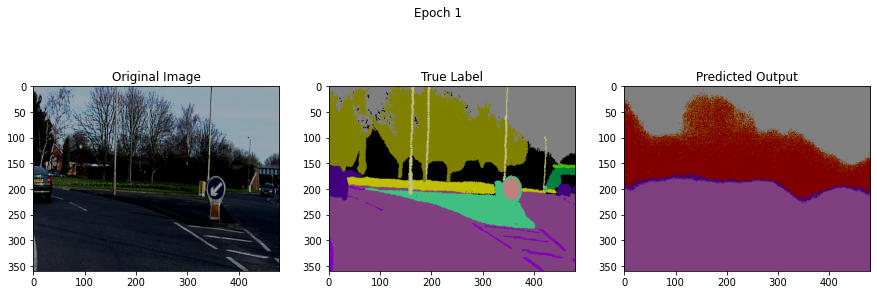

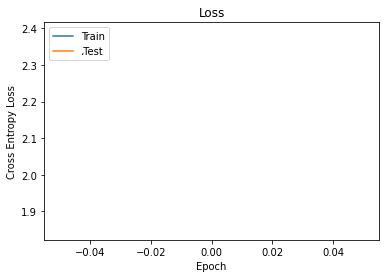

**********Epoch: 2 **********
 Epoch 2,  Iteration     9,  Loss: 1.775
 Epoch 2,  Iteration    19,  Loss: 1.716
 Epoch 2,  Iteration    29,  Loss: 1.678
 Epoch 2,  Iteration    39,  Loss: 1.682
 Epoch 2,  Iteration    49,  Loss: 1.659
 Epoch 2,  Iteration    59,  Loss: 1.650
 Epoch 2,  Iteration    69,  Loss: 1.649
 Epoch 2,  Iteration    79,  Loss: 1.644
 Epoch 2,  Iteration    89,  Loss: 1.635
 Epoch 2,  Iteration    99,  Loss: 1.627
 Epoch 2,  Iteration   109,  Loss: 1.609
 Epoch 2,  Iteration   119,  Loss: 1.594
 Epoch 2,  Iteration   129,  Loss: 1.594
 Epoch 2,  Iteration   139,  Loss: 1.589
TestLoss:  1.4424519936243694


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


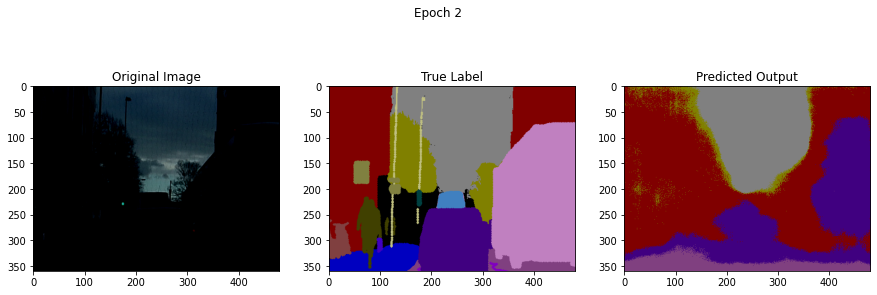

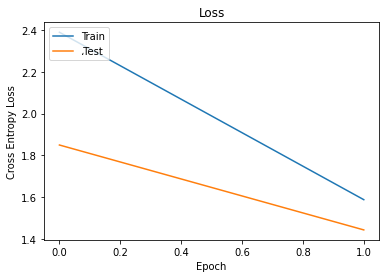

**********Epoch: 3 **********
 Epoch 3,  Iteration     9,  Loss: 1.482
 Epoch 3,  Iteration    19,  Loss: 1.461
 Epoch 3,  Iteration    29,  Loss: 1.435
 Epoch 3,  Iteration    39,  Loss: 1.440
 Epoch 3,  Iteration    49,  Loss: 1.454
 Epoch 3,  Iteration    59,  Loss: 1.447
 Epoch 3,  Iteration    69,  Loss: 1.451
 Epoch 3,  Iteration    79,  Loss: 1.450
 Epoch 3,  Iteration    89,  Loss: 1.437
 Epoch 3,  Iteration    99,  Loss: 1.431
 Epoch 3,  Iteration   109,  Loss: 1.427
 Epoch 3,  Iteration   119,  Loss: 1.425
 Epoch 3,  Iteration   129,  Loss: 1.426
 Epoch 3,  Iteration   139,  Loss: 1.417
TestLoss:  1.353157298432456


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


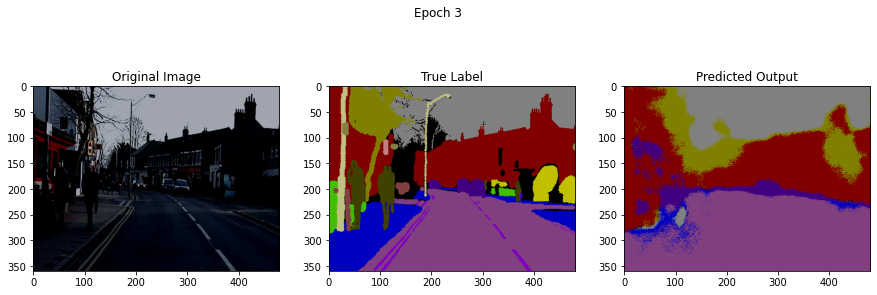

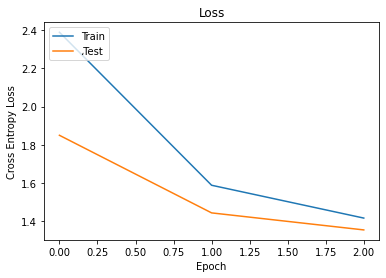

**********Epoch: 4 **********
 Epoch 4,  Iteration     9,  Loss: 1.247
 Epoch 4,  Iteration    19,  Loss: 1.286
 Epoch 4,  Iteration    29,  Loss: 1.285
 Epoch 4,  Iteration    39,  Loss: 1.293
 Epoch 4,  Iteration    49,  Loss: 1.293
 Epoch 4,  Iteration    59,  Loss: 1.301
 Epoch 4,  Iteration    69,  Loss: 1.302
 Epoch 4,  Iteration    79,  Loss: 1.298
 Epoch 4,  Iteration    89,  Loss: 1.294
 Epoch 4,  Iteration    99,  Loss: 1.291
 Epoch 4,  Iteration   109,  Loss: 1.286
 Epoch 4,  Iteration   119,  Loss: 1.284
 Epoch 4,  Iteration   129,  Loss: 1.282
 Epoch 4,  Iteration   139,  Loss: 1.283
TestLoss:  1.2848458654350705


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


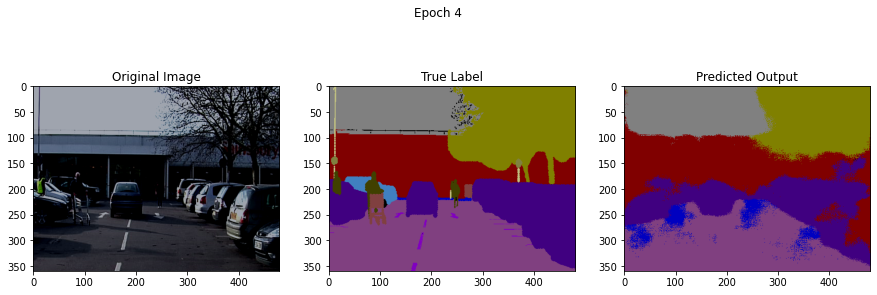

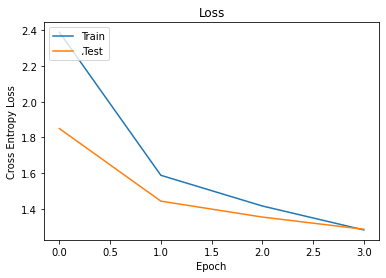

**********Epoch: 5 **********
 Epoch 5,  Iteration     9,  Loss: 1.167
 Epoch 5,  Iteration    19,  Loss: 1.213
 Epoch 5,  Iteration    29,  Loss: 1.245
 Epoch 5,  Iteration    39,  Loss: 1.229
 Epoch 5,  Iteration    49,  Loss: 1.249
 Epoch 5,  Iteration    59,  Loss: 1.239
 Epoch 5,  Iteration    69,  Loss: 1.240
 Epoch 5,  Iteration    79,  Loss: 1.235
 Epoch 5,  Iteration    89,  Loss: 1.216
 Epoch 5,  Iteration    99,  Loss: 1.201
 Epoch 5,  Iteration   109,  Loss: 1.193
 Epoch 5,  Iteration   119,  Loss: 1.191
 Epoch 5,  Iteration   129,  Loss: 1.183
 Epoch 5,  Iteration   139,  Loss: 1.184
TestLoss:  1.1008571204211977


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


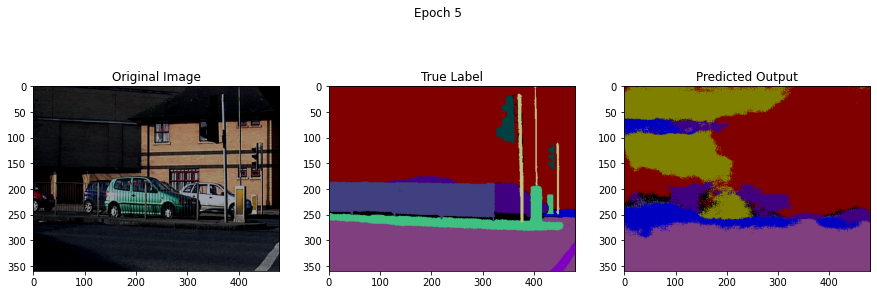

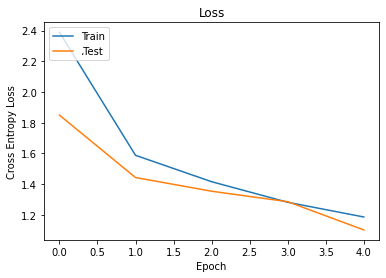

**********Epoch: 6 **********
 Epoch 6,  Iteration     9,  Loss: 1.113
 Epoch 6,  Iteration    19,  Loss: 1.156
 Epoch 6,  Iteration    29,  Loss: 1.157
 Epoch 6,  Iteration    39,  Loss: 1.148
 Epoch 6,  Iteration    49,  Loss: 1.152
 Epoch 6,  Iteration    59,  Loss: 1.147
 Epoch 6,  Iteration    69,  Loss: 1.138
 Epoch 6,  Iteration    79,  Loss: 1.138
 Epoch 6,  Iteration    89,  Loss: 1.132
 Epoch 6,  Iteration    99,  Loss: 1.118
 Epoch 6,  Iteration   109,  Loss: 1.111
 Epoch 6,  Iteration   119,  Loss: 1.109
 Epoch 6,  Iteration   129,  Loss: 1.113
 Epoch 6,  Iteration   139,  Loss: 1.113
TestLoss:  1.190403487947252


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


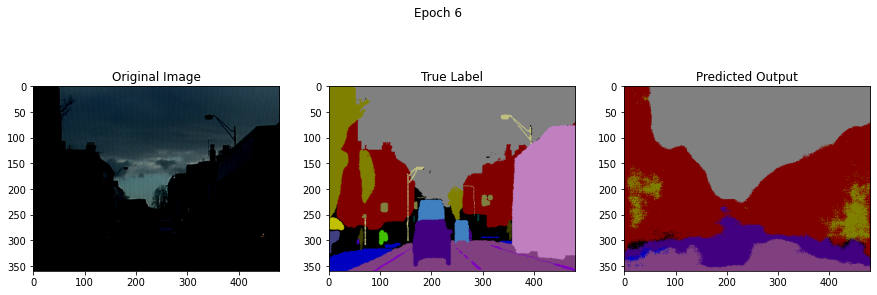

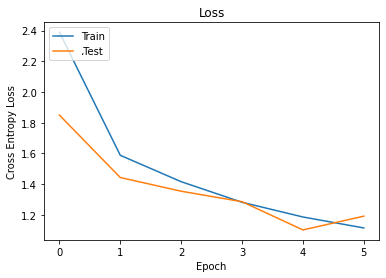

**********Epoch: 7 **********
 Epoch 7,  Iteration     9,  Loss: 1.091
 Epoch 7,  Iteration    19,  Loss: 1.107
 Epoch 7,  Iteration    29,  Loss: 1.083
 Epoch 7,  Iteration    39,  Loss: 1.073
 Epoch 7,  Iteration    49,  Loss: 1.072
 Epoch 7,  Iteration    59,  Loss: 1.073
 Epoch 7,  Iteration    69,  Loss: 1.083
 Epoch 7,  Iteration    79,  Loss: 1.082
 Epoch 7,  Iteration    89,  Loss: 1.076
 Epoch 7,  Iteration    99,  Loss: 1.080
 Epoch 7,  Iteration   109,  Loss: 1.068
 Epoch 7,  Iteration   119,  Loss: 1.073
 Epoch 7,  Iteration   129,  Loss: 1.067
 Epoch 7,  Iteration   139,  Loss: 1.064
TestLoss:  1.0440143760707643


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


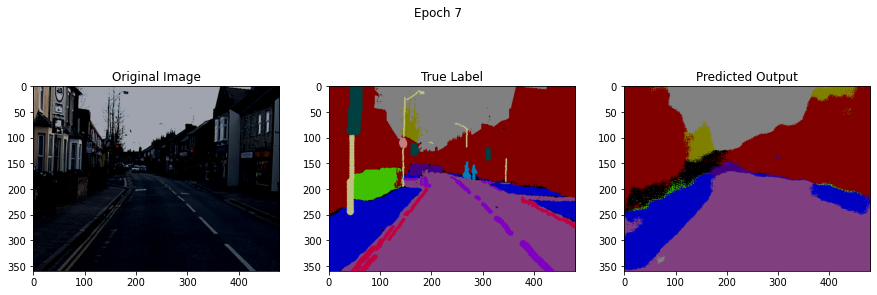

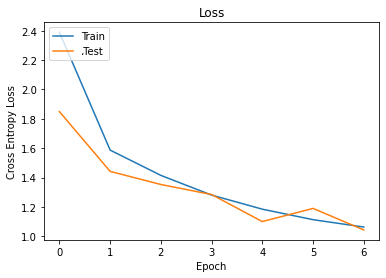

**********Epoch: 8 **********
 Epoch 8,  Iteration     9,  Loss: 0.963
 Epoch 8,  Iteration    19,  Loss: 0.967
 Epoch 8,  Iteration    29,  Loss: 1.010
 Epoch 8,  Iteration    39,  Loss: 1.040
 Epoch 8,  Iteration    49,  Loss: 1.033
 Epoch 8,  Iteration    59,  Loss: 1.037
 Epoch 8,  Iteration    69,  Loss: 1.044
 Epoch 8,  Iteration    79,  Loss: 1.037
 Epoch 8,  Iteration    89,  Loss: 1.027
 Epoch 8,  Iteration    99,  Loss: 1.026
 Epoch 8,  Iteration   109,  Loss: 1.026
 Epoch 8,  Iteration   119,  Loss: 1.025
 Epoch 8,  Iteration   129,  Loss: 1.023
 Epoch 8,  Iteration   139,  Loss: 1.024
TestLoss:  1.049014566673173


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


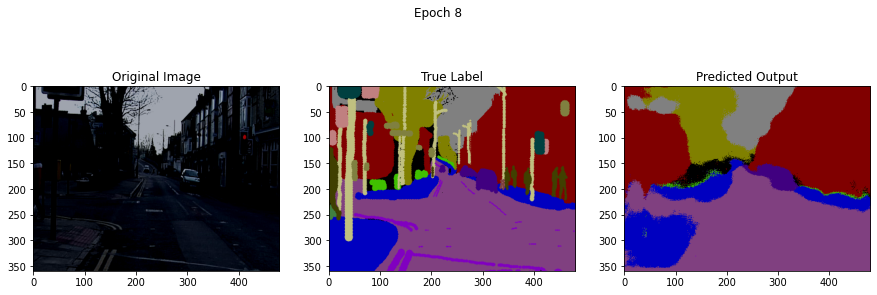

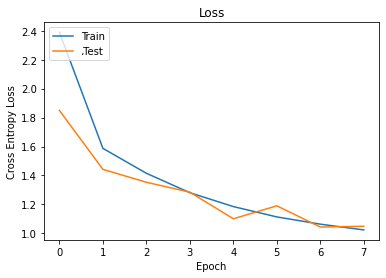

**********Epoch: 9 **********
 Epoch 9,  Iteration     9,  Loss: 1.047
 Epoch 9,  Iteration    19,  Loss: 1.038
 Epoch 9,  Iteration    29,  Loss: 1.019
 Epoch 9,  Iteration    39,  Loss: 0.995
 Epoch 9,  Iteration    49,  Loss: 0.988
 Epoch 9,  Iteration    59,  Loss: 0.998
 Epoch 9,  Iteration    69,  Loss: 0.987
 Epoch 9,  Iteration    79,  Loss: 0.986
 Epoch 9,  Iteration    89,  Loss: 0.985
 Epoch 9,  Iteration    99,  Loss: 0.982
 Epoch 9,  Iteration   109,  Loss: 0.987
 Epoch 9,  Iteration   119,  Loss: 0.986
 Epoch 9,  Iteration   129,  Loss: 0.989
 Epoch 9,  Iteration   139,  Loss: 0.993
TestLoss:  1.11734153661463


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


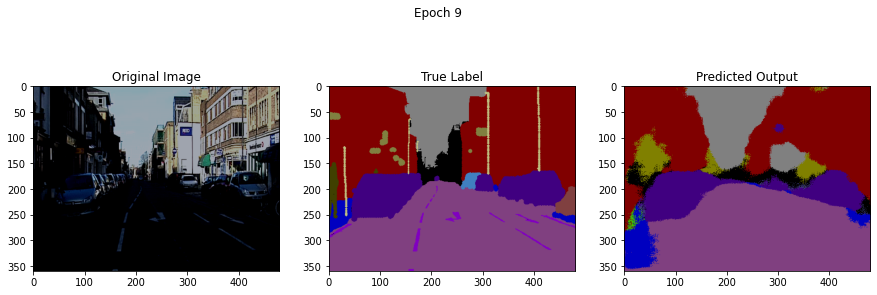

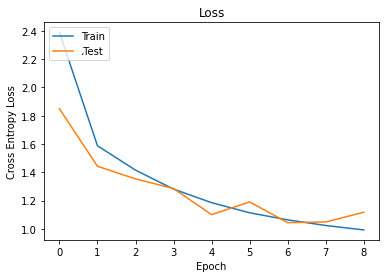

**********Epoch: 10 **********
 Epoch 10,  Iteration     9,  Loss: 0.914
 Epoch 10,  Iteration    19,  Loss: 0.997
 Epoch 10,  Iteration    29,  Loss: 0.981
 Epoch 10,  Iteration    39,  Loss: 0.966
 Epoch 10,  Iteration    49,  Loss: 0.954
 Epoch 10,  Iteration    59,  Loss: 0.957
 Epoch 10,  Iteration    69,  Loss: 0.958
 Epoch 10,  Iteration    79,  Loss: 0.970
 Epoch 10,  Iteration    89,  Loss: 0.982
 Epoch 10,  Iteration    99,  Loss: 0.981
 Epoch 10,  Iteration   109,  Loss: 0.977
 Epoch 10,  Iteration   119,  Loss: 0.976
 Epoch 10,  Iteration   129,  Loss: 0.973
 Epoch 10,  Iteration   139,  Loss: 0.971
TestLoss:  0.9831138104200363


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


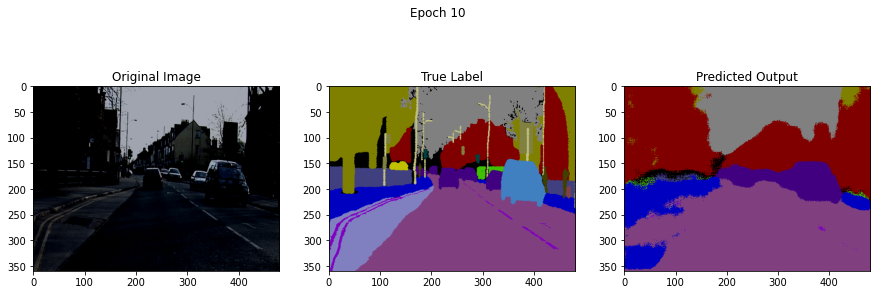

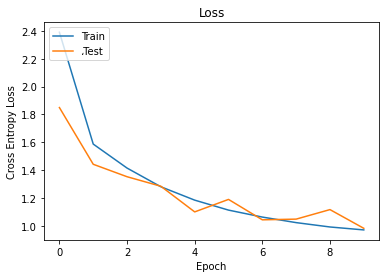

**********Epoch: 11 **********
 Epoch 11,  Iteration     9,  Loss: 0.944
 Epoch 11,  Iteration    19,  Loss: 0.920
 Epoch 11,  Iteration    29,  Loss: 0.910
 Epoch 11,  Iteration    39,  Loss: 0.933
 Epoch 11,  Iteration    49,  Loss: 0.951
 Epoch 11,  Iteration    59,  Loss: 0.953
 Epoch 11,  Iteration    69,  Loss: 0.951
 Epoch 11,  Iteration    79,  Loss: 0.961
 Epoch 11,  Iteration    89,  Loss: 0.955
 Epoch 11,  Iteration    99,  Loss: 0.956
 Epoch 11,  Iteration   109,  Loss: 0.949
 Epoch 11,  Iteration   119,  Loss: 0.951
 Epoch 11,  Iteration   129,  Loss: 0.950
 Epoch 11,  Iteration   139,  Loss: 0.947
TestLoss:  1.0150670044951968


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


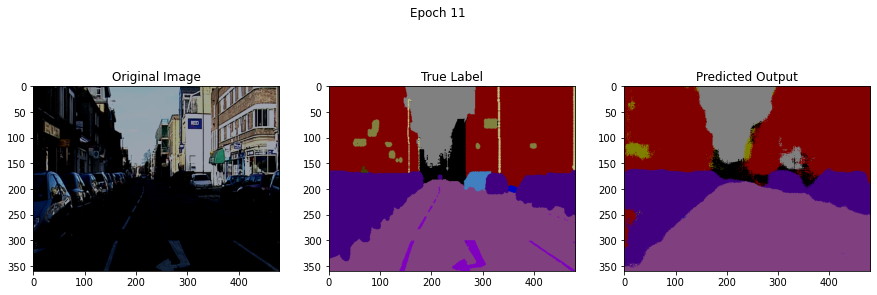

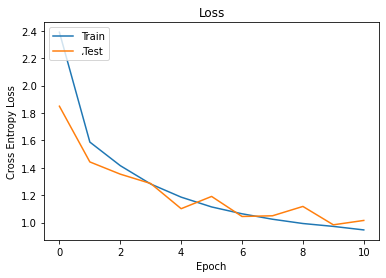

**********Epoch: 12 **********
 Epoch 12,  Iteration     9,  Loss: 0.874
 Epoch 12,  Iteration    19,  Loss: 0.894
 Epoch 12,  Iteration    29,  Loss: 0.886
 Epoch 12,  Iteration    39,  Loss: 0.897
 Epoch 12,  Iteration    49,  Loss: 0.897
 Epoch 12,  Iteration    59,  Loss: 0.904
 Epoch 12,  Iteration    69,  Loss: 0.918
 Epoch 12,  Iteration    79,  Loss: 0.917
 Epoch 12,  Iteration    89,  Loss: 0.919
 Epoch 12,  Iteration    99,  Loss: 0.919
 Epoch 12,  Iteration   109,  Loss: 0.926
 Epoch 12,  Iteration   119,  Loss: 0.923
 Epoch 12,  Iteration   129,  Loss: 0.925
 Epoch 12,  Iteration   139,  Loss: 0.917
TestLoss:  0.9179850998851988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


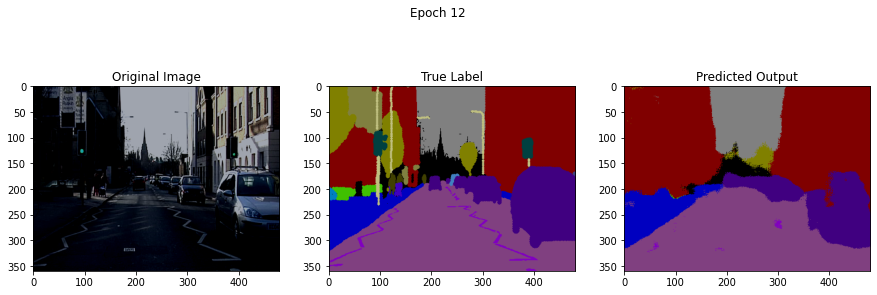

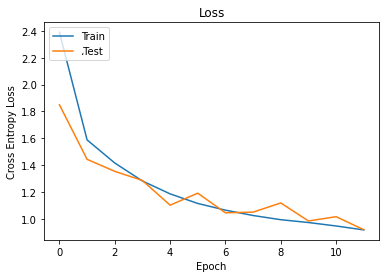

**********Epoch: 13 **********
 Epoch 13,  Iteration     9,  Loss: 0.881
 Epoch 13,  Iteration    19,  Loss: 0.919
 Epoch 13,  Iteration    29,  Loss: 0.910
 Epoch 13,  Iteration    39,  Loss: 0.926
 Epoch 13,  Iteration    49,  Loss: 0.914
 Epoch 13,  Iteration    59,  Loss: 0.913
 Epoch 13,  Iteration    69,  Loss: 0.901
 Epoch 13,  Iteration    79,  Loss: 0.889
 Epoch 13,  Iteration    89,  Loss: 0.884
 Epoch 13,  Iteration    99,  Loss: 0.890
 Epoch 13,  Iteration   109,  Loss: 0.892
 Epoch 13,  Iteration   119,  Loss: 0.892
 Epoch 13,  Iteration   129,  Loss: 0.894
 Epoch 13,  Iteration   139,  Loss: 0.891
TestLoss:  0.9175732582807541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


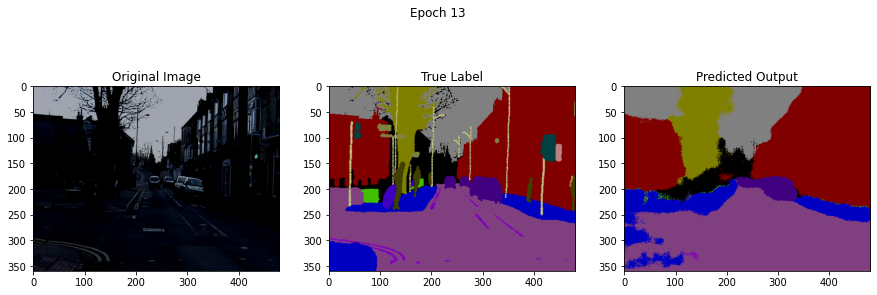

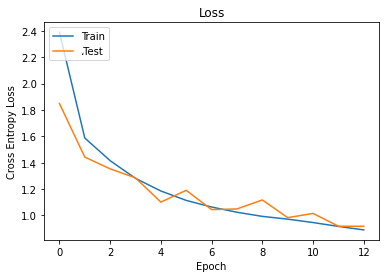

**********Epoch: 14 **********
 Epoch 14,  Iteration     9,  Loss: 0.829
 Epoch 14,  Iteration    19,  Loss: 0.854
 Epoch 14,  Iteration    29,  Loss: 0.884
 Epoch 14,  Iteration    39,  Loss: 0.891
 Epoch 14,  Iteration    49,  Loss: 0.887
 Epoch 14,  Iteration    59,  Loss: 0.895
 Epoch 14,  Iteration    69,  Loss: 0.884
 Epoch 14,  Iteration    79,  Loss: 0.880
 Epoch 14,  Iteration    89,  Loss: 0.874
 Epoch 14,  Iteration    99,  Loss: 0.875
 Epoch 14,  Iteration   109,  Loss: 0.877
 Epoch 14,  Iteration   119,  Loss: 0.878
 Epoch 14,  Iteration   129,  Loss: 0.876
 Epoch 14,  Iteration   139,  Loss: 0.868
TestLoss:  0.9055831647581525


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


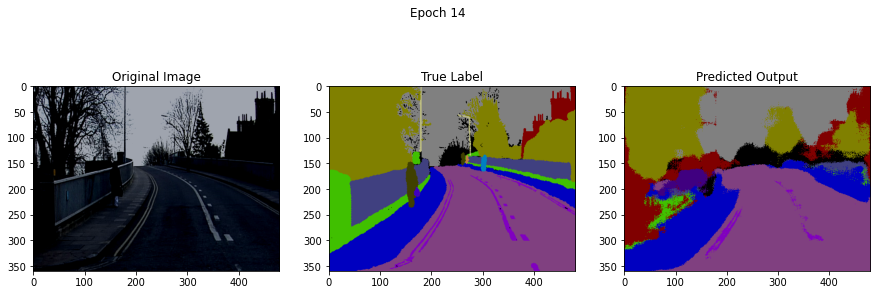

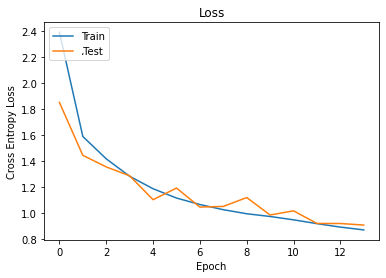

**********Epoch: 15 **********
 Epoch 15,  Iteration     9,  Loss: 0.796
 Epoch 15,  Iteration    19,  Loss: 0.832
 Epoch 15,  Iteration    29,  Loss: 0.864
 Epoch 15,  Iteration    39,  Loss: 0.870
 Epoch 15,  Iteration    49,  Loss: 0.889
 Epoch 15,  Iteration    59,  Loss: 0.884
 Epoch 15,  Iteration    69,  Loss: 0.877
 Epoch 15,  Iteration    79,  Loss: 0.874
 Epoch 15,  Iteration    89,  Loss: 0.866
 Epoch 15,  Iteration    99,  Loss: 0.866
 Epoch 15,  Iteration   109,  Loss: 0.860
 Epoch 15,  Iteration   119,  Loss: 0.865
 Epoch 15,  Iteration   129,  Loss: 0.864
 Epoch 15,  Iteration   139,  Loss: 0.867
TestLoss:  0.8931558860672845


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


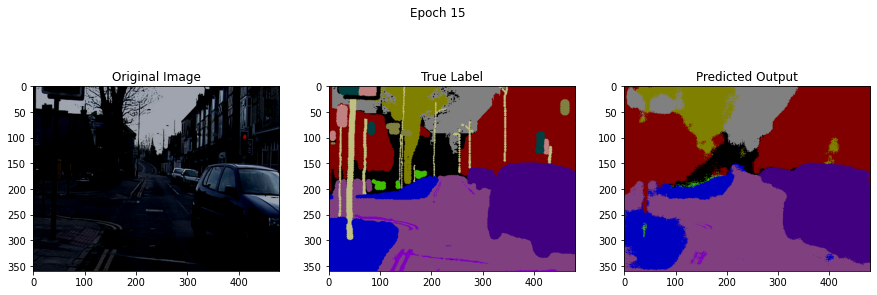

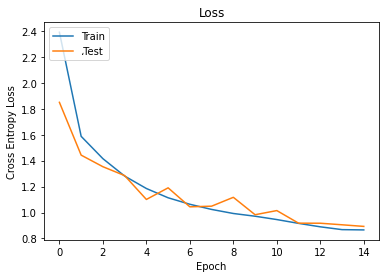

**********Epoch: 16 **********
 Epoch 16,  Iteration     9,  Loss: 0.849
 Epoch 16,  Iteration    19,  Loss: 0.841
 Epoch 16,  Iteration    29,  Loss: 0.851
 Epoch 16,  Iteration    39,  Loss: 0.840
 Epoch 16,  Iteration    49,  Loss: 0.850
 Epoch 16,  Iteration    59,  Loss: 0.847
 Epoch 16,  Iteration    69,  Loss: 0.851
 Epoch 16,  Iteration    79,  Loss: 0.846
 Epoch 16,  Iteration    89,  Loss: 0.848
 Epoch 16,  Iteration    99,  Loss: 0.845
 Epoch 16,  Iteration   109,  Loss: 0.851
 Epoch 16,  Iteration   119,  Loss: 0.854
 Epoch 16,  Iteration   129,  Loss: 0.852
 Epoch 16,  Iteration   139,  Loss: 0.851
TestLoss:  0.8719537109136581


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


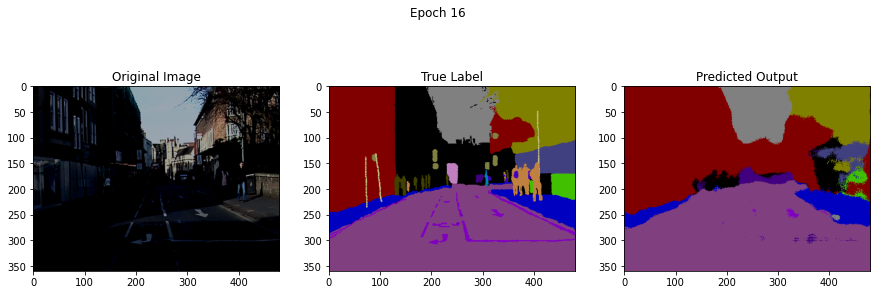

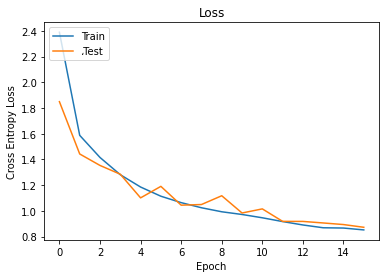

**********Epoch: 17 **********
 Epoch 17,  Iteration     9,  Loss: 0.808
 Epoch 17,  Iteration    19,  Loss: 0.829
 Epoch 17,  Iteration    29,  Loss: 0.825
 Epoch 17,  Iteration    39,  Loss: 0.824
 Epoch 17,  Iteration    49,  Loss: 0.822
 Epoch 17,  Iteration    59,  Loss: 0.816
 Epoch 17,  Iteration    69,  Loss: 0.817
 Epoch 17,  Iteration    79,  Loss: 0.816
 Epoch 17,  Iteration    89,  Loss: 0.817
 Epoch 17,  Iteration    99,  Loss: 0.825
 Epoch 17,  Iteration   109,  Loss: 0.822
 Epoch 17,  Iteration   119,  Loss: 0.820
 Epoch 17,  Iteration   129,  Loss: 0.822
 Epoch 17,  Iteration   139,  Loss: 0.826
TestLoss:  0.9049972593784332


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


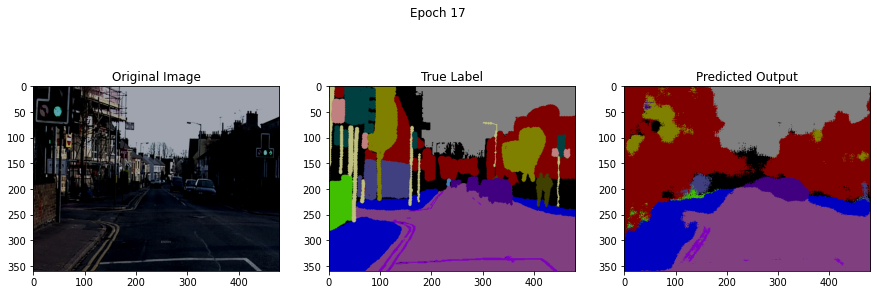

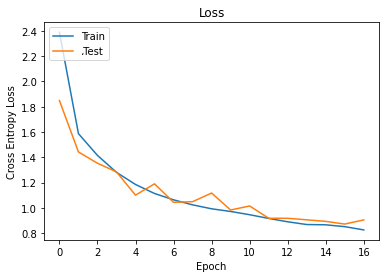

**********Epoch: 18 **********
 Epoch 18,  Iteration     9,  Loss: 0.912
 Epoch 18,  Iteration    19,  Loss: 0.838
 Epoch 18,  Iteration    29,  Loss: 0.832
 Epoch 18,  Iteration    39,  Loss: 0.826
 Epoch 18,  Iteration    49,  Loss: 0.825
 Epoch 18,  Iteration    59,  Loss: 0.813
 Epoch 18,  Iteration    69,  Loss: 0.817
 Epoch 18,  Iteration    79,  Loss: 0.814
 Epoch 18,  Iteration    89,  Loss: 0.814
 Epoch 18,  Iteration    99,  Loss: 0.812
 Epoch 18,  Iteration   109,  Loss: 0.806
 Epoch 18,  Iteration   119,  Loss: 0.800
 Epoch 18,  Iteration   129,  Loss: 0.797
 Epoch 18,  Iteration   139,  Loss: 0.807
TestLoss:  0.8587833957539664


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


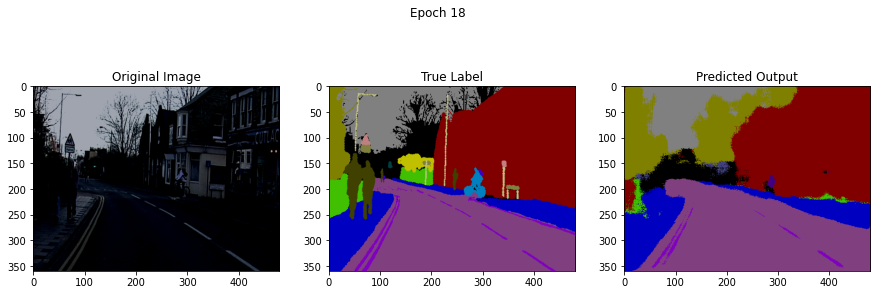

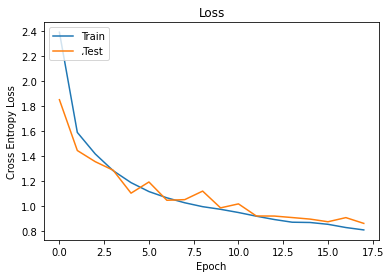

**********Epoch: 19 **********
 Epoch 19,  Iteration     9,  Loss: 0.818
 Epoch 19,  Iteration    19,  Loss: 0.775
 Epoch 19,  Iteration    29,  Loss: 0.769
 Epoch 19,  Iteration    39,  Loss: 0.770
 Epoch 19,  Iteration    49,  Loss: 0.785
 Epoch 19,  Iteration    59,  Loss: 0.788
 Epoch 19,  Iteration    69,  Loss: 0.799
 Epoch 19,  Iteration    79,  Loss: 0.800
 Epoch 19,  Iteration    89,  Loss: 0.810
 Epoch 19,  Iteration    99,  Loss: 0.805
 Epoch 19,  Iteration   109,  Loss: 0.801
 Epoch 19,  Iteration   119,  Loss: 0.802
 Epoch 19,  Iteration   129,  Loss: 0.795
 Epoch 19,  Iteration   139,  Loss: 0.798
TestLoss:  0.8426372127400504


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


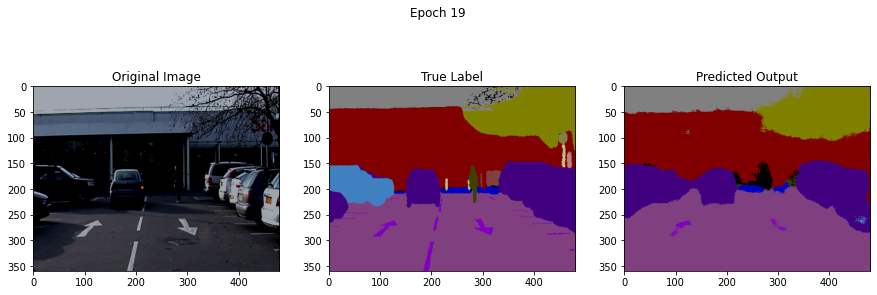

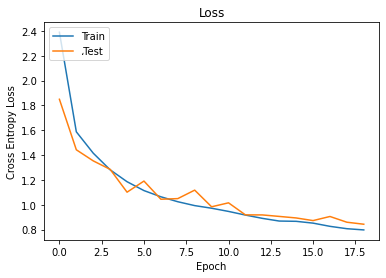

**********Epoch: 20 **********
 Epoch 20,  Iteration     9,  Loss: 0.723
 Epoch 20,  Iteration    19,  Loss: 0.726
 Epoch 20,  Iteration    29,  Loss: 0.766
 Epoch 20,  Iteration    39,  Loss: 0.775
 Epoch 20,  Iteration    49,  Loss: 0.772
 Epoch 20,  Iteration    59,  Loss: 0.767
 Epoch 20,  Iteration    69,  Loss: 0.771
 Epoch 20,  Iteration    79,  Loss: 0.769
 Epoch 20,  Iteration    89,  Loss: 0.775
 Epoch 20,  Iteration    99,  Loss: 0.772
 Epoch 20,  Iteration   109,  Loss: 0.778
 Epoch 20,  Iteration   119,  Loss: 0.780
 Epoch 20,  Iteration   129,  Loss: 0.775
 Epoch 20,  Iteration   139,  Loss: 0.771
TestLoss:  0.8680912173456616


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


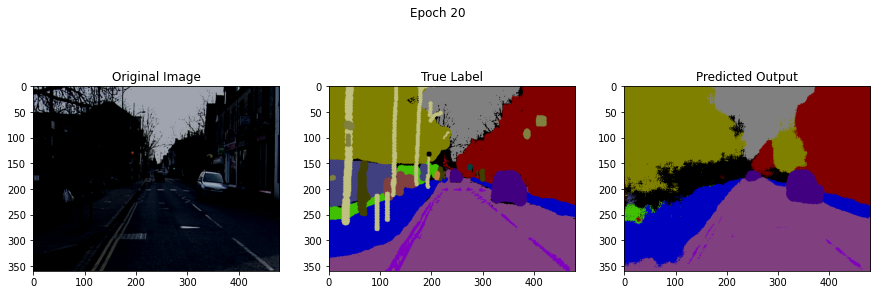

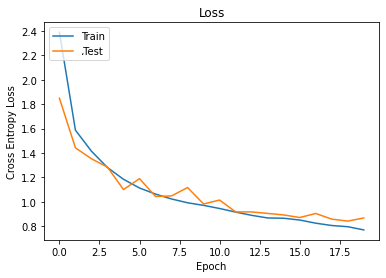

**********Epoch: 21 **********
 Epoch 21,  Iteration     9,  Loss: 0.790
 Epoch 21,  Iteration    19,  Loss: 0.754
 Epoch 21,  Iteration    29,  Loss: 0.757
 Epoch 21,  Iteration    39,  Loss: 0.755
 Epoch 21,  Iteration    49,  Loss: 0.756
 Epoch 21,  Iteration    59,  Loss: 0.749
 Epoch 21,  Iteration    69,  Loss: 0.746
 Epoch 21,  Iteration    79,  Loss: 0.746
 Epoch 21,  Iteration    89,  Loss: 0.748
 Epoch 21,  Iteration    99,  Loss: 0.765
 Epoch 21,  Iteration   109,  Loss: 0.772
 Epoch 21,  Iteration   119,  Loss: 0.773
 Epoch 21,  Iteration   129,  Loss: 0.776
 Epoch 21,  Iteration   139,  Loss: 0.774
TestLoss:  0.8103175047371123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


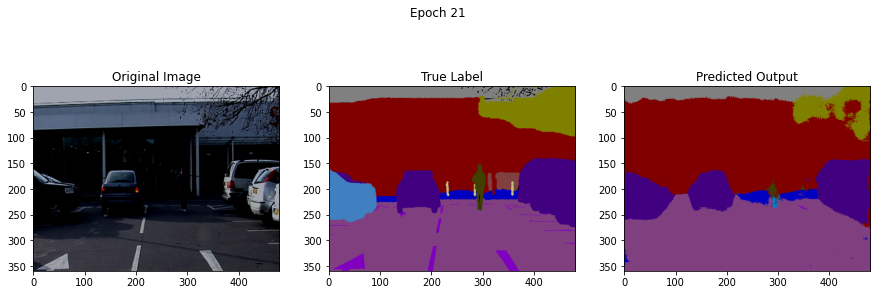

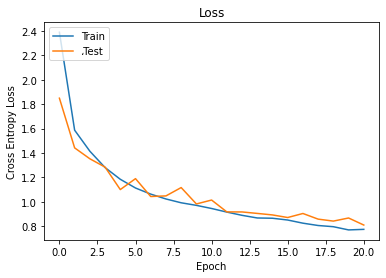

**********Epoch: 22 **********
 Epoch 22,  Iteration     9,  Loss: 0.808
 Epoch 22,  Iteration    19,  Loss: 0.789
 Epoch 22,  Iteration    29,  Loss: 0.759
 Epoch 22,  Iteration    39,  Loss: 0.748
 Epoch 22,  Iteration    49,  Loss: 0.758
 Epoch 22,  Iteration    59,  Loss: 0.751
 Epoch 22,  Iteration    69,  Loss: 0.768
 Epoch 22,  Iteration    79,  Loss: 0.761
 Epoch 22,  Iteration    89,  Loss: 0.770
 Epoch 22,  Iteration    99,  Loss: 0.766
 Epoch 22,  Iteration   109,  Loss: 0.763
 Epoch 22,  Iteration   119,  Loss: 0.762
 Epoch 22,  Iteration   129,  Loss: 0.758
 Epoch 22,  Iteration   139,  Loss: 0.755
TestLoss:  0.8078922000196245


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


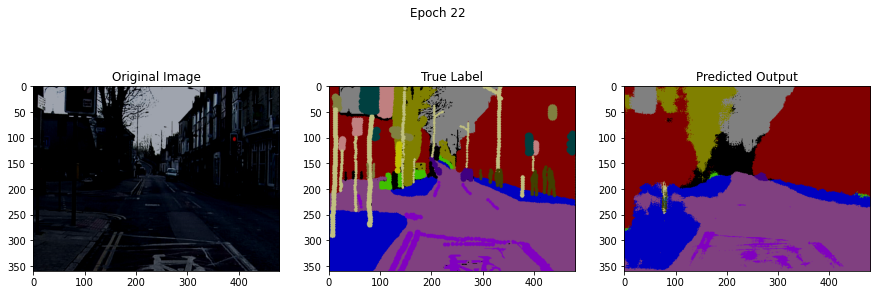

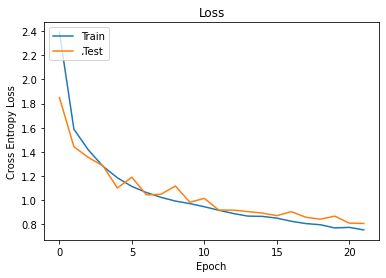

**********Epoch: 23 **********
 Epoch 23,  Iteration     9,  Loss: 0.786
 Epoch 23,  Iteration    19,  Loss: 0.792
 Epoch 23,  Iteration    29,  Loss: 0.766
 Epoch 23,  Iteration    39,  Loss: 0.761
 Epoch 23,  Iteration    49,  Loss: 0.752
 Epoch 23,  Iteration    59,  Loss: 0.743
 Epoch 23,  Iteration    69,  Loss: 0.743
 Epoch 23,  Iteration    79,  Loss: 0.742
 Epoch 23,  Iteration    89,  Loss: 0.736
 Epoch 23,  Iteration    99,  Loss: 0.741
 Epoch 23,  Iteration   109,  Loss: 0.739
 Epoch 23,  Iteration   119,  Loss: 0.740
 Epoch 23,  Iteration   129,  Loss: 0.742
 Epoch 23,  Iteration   139,  Loss: 0.739
TestLoss:  0.7990658746825324


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


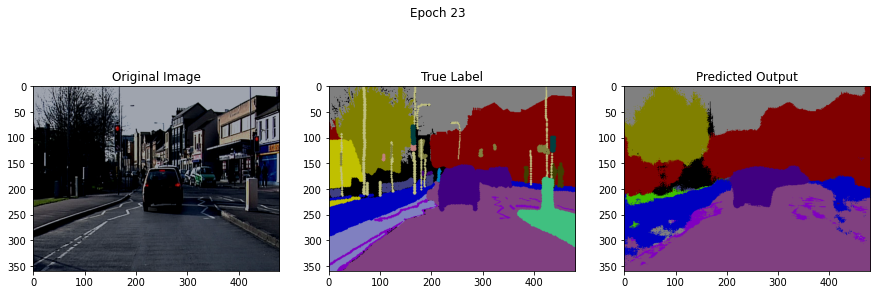

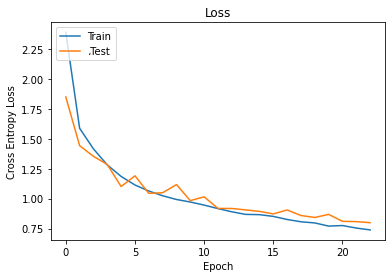

**********Epoch: 24 **********
 Epoch 24,  Iteration     9,  Loss: 0.744
 Epoch 24,  Iteration    19,  Loss: 0.744
 Epoch 24,  Iteration    29,  Loss: 0.732
 Epoch 24,  Iteration    39,  Loss: 0.716
 Epoch 24,  Iteration    49,  Loss: 0.710
 Epoch 24,  Iteration    59,  Loss: 0.711
 Epoch 24,  Iteration    69,  Loss: 0.724
 Epoch 24,  Iteration    79,  Loss: 0.730
 Epoch 24,  Iteration    89,  Loss: 0.736
 Epoch 24,  Iteration    99,  Loss: 0.733
 Epoch 24,  Iteration   109,  Loss: 0.733
 Epoch 24,  Iteration   119,  Loss: 0.733
 Epoch 24,  Iteration   129,  Loss: 0.732
 Epoch 24,  Iteration   139,  Loss: 0.736
TestLoss:  0.7797941482729382


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


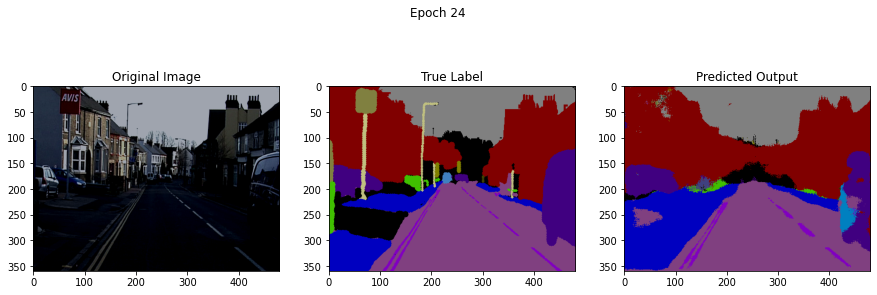

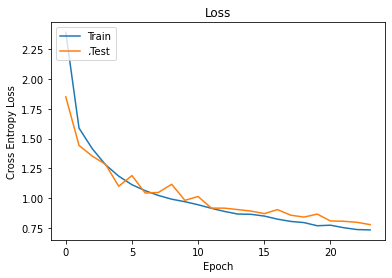

**********Epoch: 25 **********
 Epoch 25,  Iteration     9,  Loss: 0.679
 Epoch 25,  Iteration    19,  Loss: 0.726
 Epoch 25,  Iteration    29,  Loss: 0.703
 Epoch 25,  Iteration    39,  Loss: 0.699
 Epoch 25,  Iteration    49,  Loss: 0.698
 Epoch 25,  Iteration    59,  Loss: 0.718
 Epoch 25,  Iteration    69,  Loss: 0.711
 Epoch 25,  Iteration    79,  Loss: 0.709
 Epoch 25,  Iteration    89,  Loss: 0.707
 Epoch 25,  Iteration    99,  Loss: 0.709
 Epoch 25,  Iteration   109,  Loss: 0.713
 Epoch 25,  Iteration   119,  Loss: 0.715
 Epoch 25,  Iteration   129,  Loss: 0.720
 Epoch 25,  Iteration   139,  Loss: 0.721
TestLoss:  0.7791845566696591


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


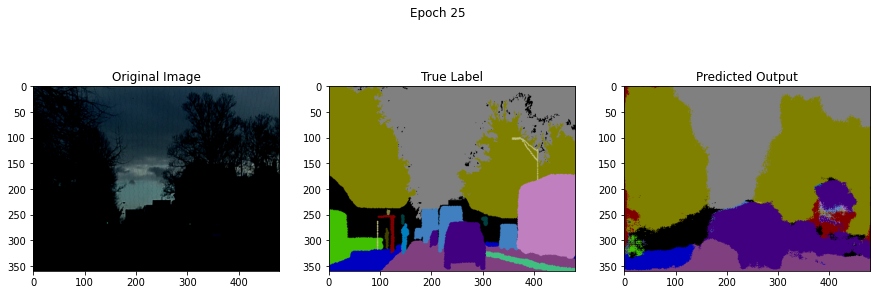

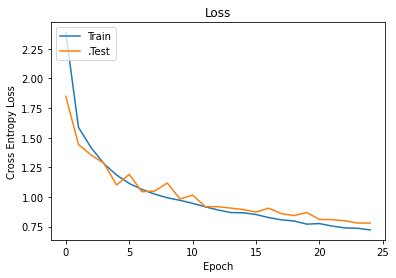

**********Epoch: 26 **********
 Epoch 26,  Iteration     9,  Loss: 0.706
 Epoch 26,  Iteration    19,  Loss: 0.704
 Epoch 26,  Iteration    29,  Loss: 0.703
 Epoch 26,  Iteration    39,  Loss: 0.699
 Epoch 26,  Iteration    49,  Loss: 0.708
 Epoch 26,  Iteration    59,  Loss: 0.710
 Epoch 26,  Iteration    69,  Loss: 0.711
 Epoch 26,  Iteration    79,  Loss: 0.706
 Epoch 26,  Iteration    89,  Loss: 0.702
 Epoch 26,  Iteration    99,  Loss: 0.707
 Epoch 26,  Iteration   109,  Loss: 0.711
 Epoch 26,  Iteration   119,  Loss: 0.709
 Epoch 26,  Iteration   129,  Loss: 0.709
 Epoch 26,  Iteration   139,  Loss: 0.711
TestLoss:  0.8243815981679492


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


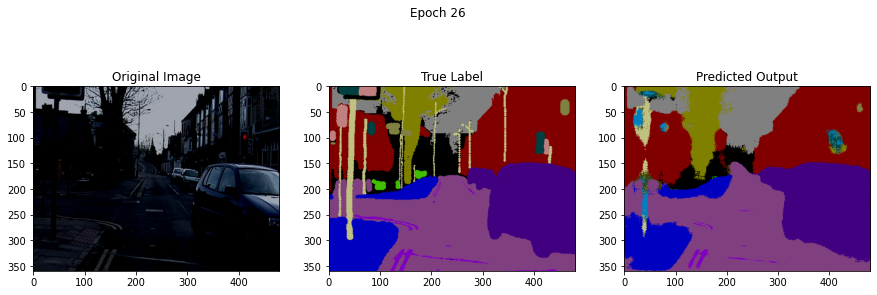

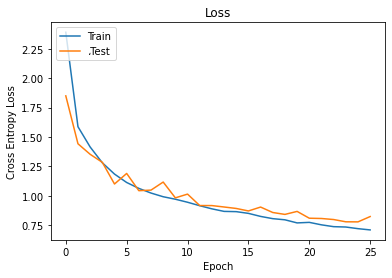

**********Epoch: 27 **********
 Epoch 27,  Iteration     9,  Loss: 0.705
 Epoch 27,  Iteration    19,  Loss: 0.708
 Epoch 27,  Iteration    29,  Loss: 0.703
 Epoch 27,  Iteration    39,  Loss: 0.690
 Epoch 27,  Iteration    49,  Loss: 0.688
 Epoch 27,  Iteration    59,  Loss: 0.690
 Epoch 27,  Iteration    69,  Loss: 0.685
 Epoch 27,  Iteration    79,  Loss: 0.692
 Epoch 27,  Iteration    89,  Loss: 0.679
 Epoch 27,  Iteration    99,  Loss: 0.689
 Epoch 27,  Iteration   109,  Loss: 0.699
 Epoch 27,  Iteration   119,  Loss: 0.695
 Epoch 27,  Iteration   129,  Loss: 0.696
 Epoch 27,  Iteration   139,  Loss: 0.694
TestLoss:  0.736208364367485


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


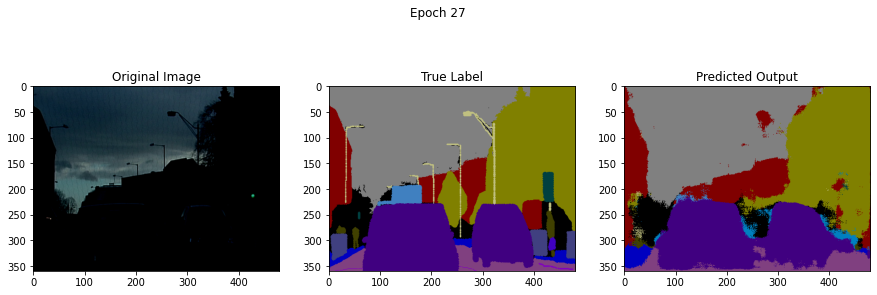

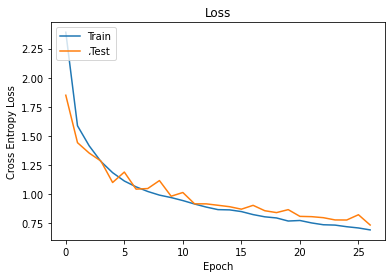

**********Epoch: 28 **********
 Epoch 28,  Iteration     9,  Loss: 0.617
 Epoch 28,  Iteration    19,  Loss: 0.651
 Epoch 28,  Iteration    29,  Loss: 0.683
 Epoch 28,  Iteration    39,  Loss: 0.674
 Epoch 28,  Iteration    49,  Loss: 0.666
 Epoch 28,  Iteration    59,  Loss: 0.681
 Epoch 28,  Iteration    69,  Loss: 0.678
 Epoch 28,  Iteration    79,  Loss: 0.677
 Epoch 28,  Iteration    89,  Loss: 0.688
 Epoch 28,  Iteration    99,  Loss: 0.687
 Epoch 28,  Iteration   109,  Loss: 0.683
 Epoch 28,  Iteration   119,  Loss: 0.688
 Epoch 28,  Iteration   129,  Loss: 0.689
 Epoch 28,  Iteration   139,  Loss: 0.689
TestLoss:  0.7545424567328559


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


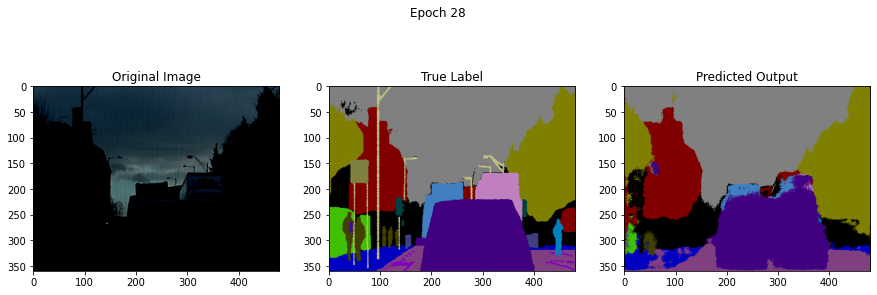

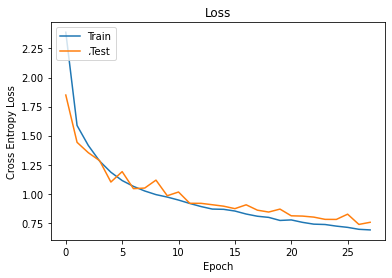

**********Epoch: 29 **********
 Epoch 29,  Iteration     9,  Loss: 0.669
 Epoch 29,  Iteration    19,  Loss: 0.703
 Epoch 29,  Iteration    29,  Loss: 0.694
 Epoch 29,  Iteration    39,  Loss: 0.685
 Epoch 29,  Iteration    49,  Loss: 0.694
 Epoch 29,  Iteration    59,  Loss: 0.692
 Epoch 29,  Iteration    69,  Loss: 0.682
 Epoch 29,  Iteration    79,  Loss: 0.689
 Epoch 29,  Iteration    89,  Loss: 0.682
 Epoch 29,  Iteration    99,  Loss: 0.681
 Epoch 29,  Iteration   109,  Loss: 0.679
 Epoch 29,  Iteration   119,  Loss: 0.680
 Epoch 29,  Iteration   129,  Loss: 0.681
 Epoch 29,  Iteration   139,  Loss: 0.678
TestLoss:  0.7817789167165756


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


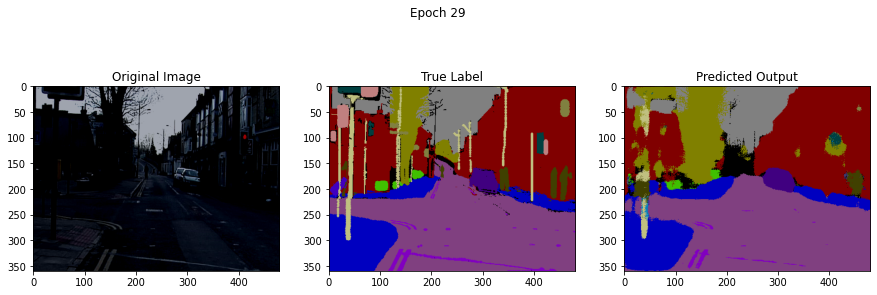

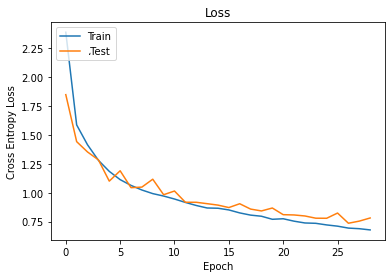

**********Epoch: 30 **********
 Epoch 30,  Iteration     9,  Loss: 0.684
 Epoch 30,  Iteration    19,  Loss: 0.697
 Epoch 30,  Iteration    29,  Loss: 0.678
 Epoch 30,  Iteration    39,  Loss: 0.668
 Epoch 30,  Iteration    49,  Loss: 0.667
 Epoch 30,  Iteration    59,  Loss: 0.667
 Epoch 30,  Iteration    69,  Loss: 0.679
 Epoch 30,  Iteration    79,  Loss: 0.675
 Epoch 30,  Iteration    89,  Loss: 0.673
 Epoch 30,  Iteration    99,  Loss: 0.670
 Epoch 30,  Iteration   109,  Loss: 0.672
 Epoch 30,  Iteration   119,  Loss: 0.670
 Epoch 30,  Iteration   129,  Loss: 0.673
 Epoch 30,  Iteration   139,  Loss: 0.674
TestLoss:  0.728221658203337


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


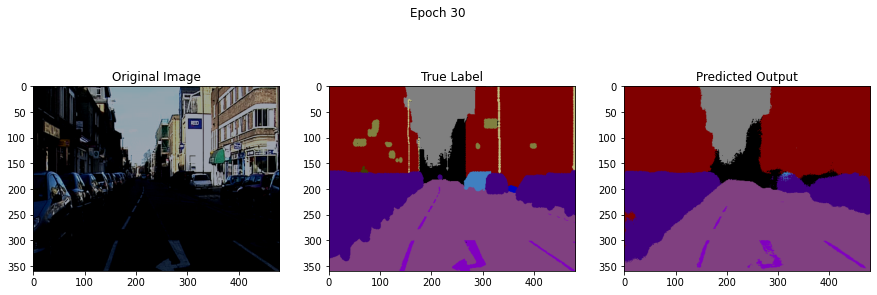

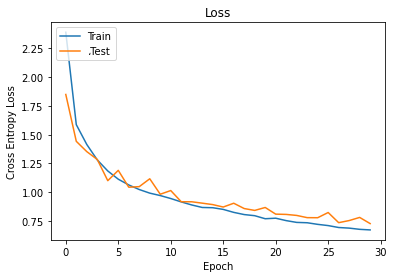

**********Epoch: 31 **********
 Epoch 31,  Iteration     9,  Loss: 0.734
 Epoch 31,  Iteration    19,  Loss: 0.704
 Epoch 31,  Iteration    29,  Loss: 0.669
 Epoch 31,  Iteration    39,  Loss: 0.671
 Epoch 31,  Iteration    49,  Loss: 0.660
 Epoch 31,  Iteration    59,  Loss: 0.664
 Epoch 31,  Iteration    69,  Loss: 0.664
 Epoch 31,  Iteration    79,  Loss: 0.671
 Epoch 31,  Iteration    89,  Loss: 0.665
 Epoch 31,  Iteration    99,  Loss: 0.663
 Epoch 31,  Iteration   109,  Loss: 0.662
 Epoch 31,  Iteration   119,  Loss: 0.663
 Epoch 31,  Iteration   129,  Loss: 0.667
 Epoch 31,  Iteration   139,  Loss: 0.670
TestLoss:  0.7804315437873205


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


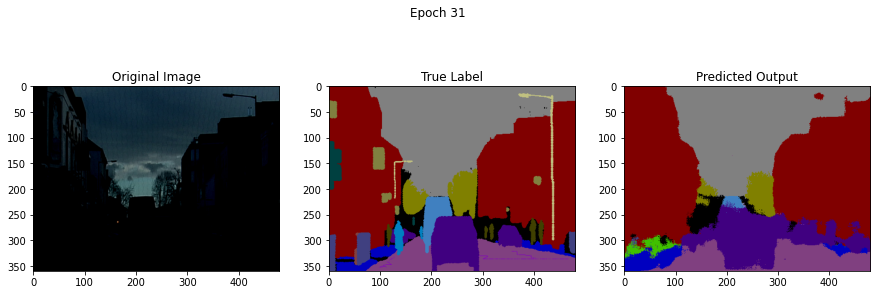

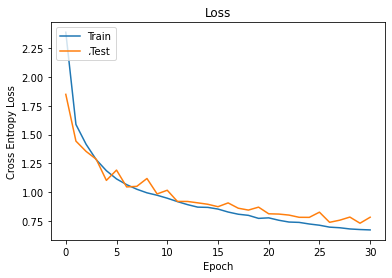

**********Epoch: 32 **********
 Epoch 32,  Iteration     9,  Loss: 0.621
 Epoch 32,  Iteration    19,  Loss: 0.629
 Epoch 32,  Iteration    29,  Loss: 0.669
 Epoch 32,  Iteration    39,  Loss: 0.666
 Epoch 32,  Iteration    49,  Loss: 0.660
 Epoch 32,  Iteration    59,  Loss: 0.656
 Epoch 32,  Iteration    69,  Loss: 0.655
 Epoch 32,  Iteration    79,  Loss: 0.653
 Epoch 32,  Iteration    89,  Loss: 0.650
 Epoch 32,  Iteration    99,  Loss: 0.658
 Epoch 32,  Iteration   109,  Loss: 0.663
 Epoch 32,  Iteration   119,  Loss: 0.665
 Epoch 32,  Iteration   129,  Loss: 0.660
 Epoch 32,  Iteration   139,  Loss: 0.662
TestLoss:  0.804711831940545


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


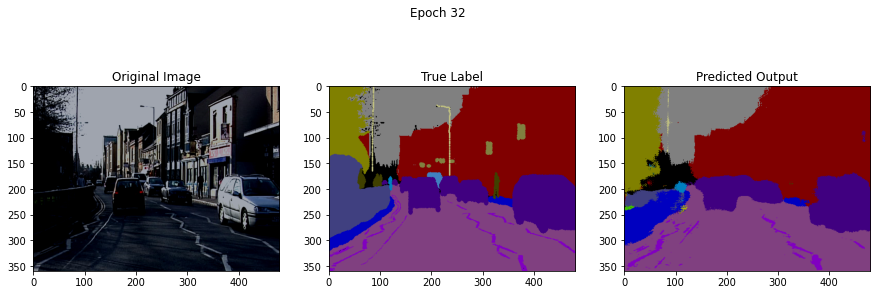

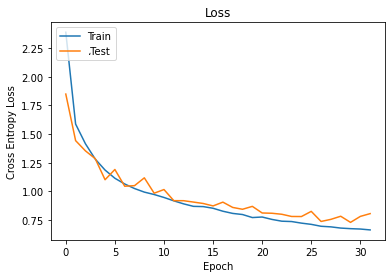

**********Epoch: 33 **********
 Epoch 33,  Iteration     9,  Loss: 0.652
 Epoch 33,  Iteration    19,  Loss: 0.642
 Epoch 33,  Iteration    29,  Loss: 0.650
 Epoch 33,  Iteration    39,  Loss: 0.666
 Epoch 33,  Iteration    49,  Loss: 0.665
 Epoch 33,  Iteration    59,  Loss: 0.660
 Epoch 33,  Iteration    69,  Loss: 0.672
 Epoch 33,  Iteration    79,  Loss: 0.674
 Epoch 33,  Iteration    89,  Loss: 0.675
 Epoch 33,  Iteration    99,  Loss: 0.668
 Epoch 33,  Iteration   109,  Loss: 0.665
 Epoch 33,  Iteration   119,  Loss: 0.665
 Epoch 33,  Iteration   129,  Loss: 0.661
 Epoch 33,  Iteration   139,  Loss: 0.659
TestLoss:  0.7025815149148306


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


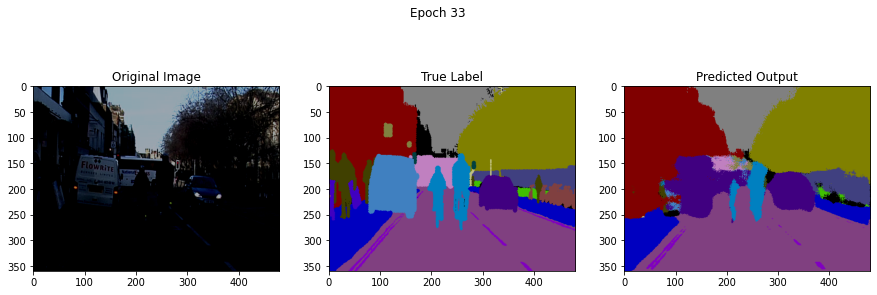

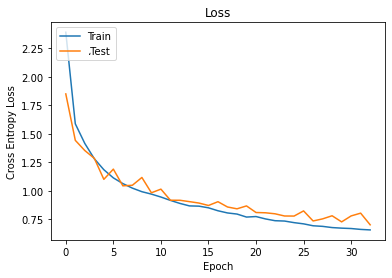

**********Epoch: 34 **********
 Epoch 34,  Iteration     9,  Loss: 0.613
 Epoch 34,  Iteration    19,  Loss: 0.620
 Epoch 34,  Iteration    29,  Loss: 0.606
 Epoch 34,  Iteration    39,  Loss: 0.621
 Epoch 34,  Iteration    49,  Loss: 0.628
 Epoch 34,  Iteration    59,  Loss: 0.629
 Epoch 34,  Iteration    69,  Loss: 0.623
 Epoch 34,  Iteration    79,  Loss: 0.624
 Epoch 34,  Iteration    89,  Loss: 0.626
 Epoch 34,  Iteration    99,  Loss: 0.631
 Epoch 34,  Iteration   109,  Loss: 0.632
 Epoch 34,  Iteration   119,  Loss: 0.634
 Epoch 34,  Iteration   129,  Loss: 0.640
 Epoch 34,  Iteration   139,  Loss: 0.636
TestLoss:  0.6869523997108141


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


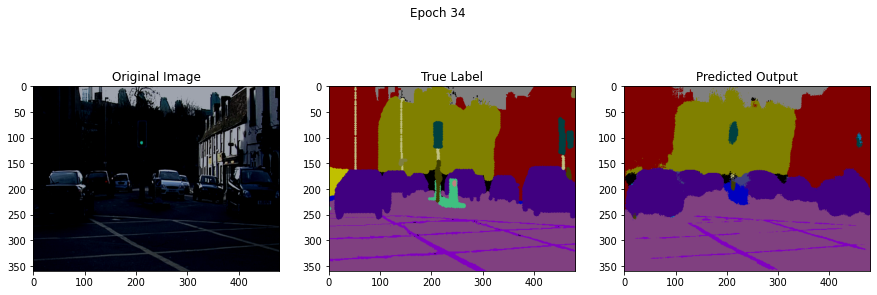

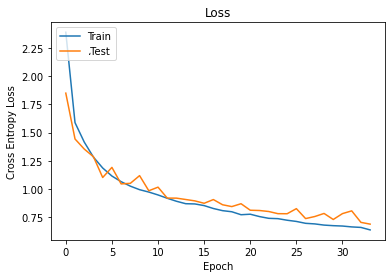

**********Epoch: 35 **********
 Epoch 35,  Iteration     9,  Loss: 0.649
 Epoch 35,  Iteration    19,  Loss: 0.617
 Epoch 35,  Iteration    29,  Loss: 0.585
 Epoch 35,  Iteration    39,  Loss: 0.604
 Epoch 35,  Iteration    49,  Loss: 0.605
 Epoch 35,  Iteration    59,  Loss: 0.622
 Epoch 35,  Iteration    69,  Loss: 0.617
 Epoch 35,  Iteration    79,  Loss: 0.611
 Epoch 35,  Iteration    89,  Loss: 0.612
 Epoch 35,  Iteration    99,  Loss: 0.611
 Epoch 35,  Iteration   109,  Loss: 0.616
 Epoch 35,  Iteration   119,  Loss: 0.620
 Epoch 35,  Iteration   129,  Loss: 0.619
 Epoch 35,  Iteration   139,  Loss: 0.623
TestLoss:  0.6773843897713555


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


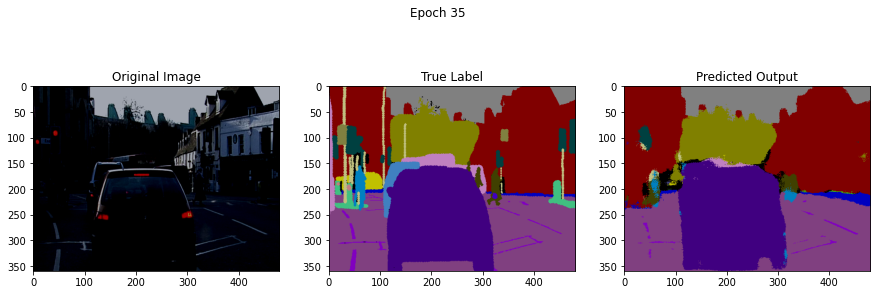

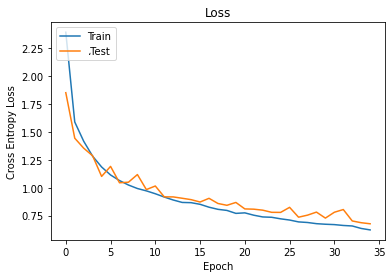

**********Epoch: 36 **********
 Epoch 36,  Iteration     9,  Loss: 0.613
 Epoch 36,  Iteration    19,  Loss: 0.599
 Epoch 36,  Iteration    29,  Loss: 0.607
 Epoch 36,  Iteration    39,  Loss: 0.603
 Epoch 36,  Iteration    49,  Loss: 0.602
 Epoch 36,  Iteration    59,  Loss: 0.600
 Epoch 36,  Iteration    69,  Loss: 0.600
 Epoch 36,  Iteration    79,  Loss: 0.617
 Epoch 36,  Iteration    89,  Loss: 0.620
 Epoch 36,  Iteration    99,  Loss: 0.619
 Epoch 36,  Iteration   109,  Loss: 0.620
 Epoch 36,  Iteration   119,  Loss: 0.617
 Epoch 36,  Iteration   129,  Loss: 0.620
 Epoch 36,  Iteration   139,  Loss: 0.621
TestLoss:  0.7279008593824174


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


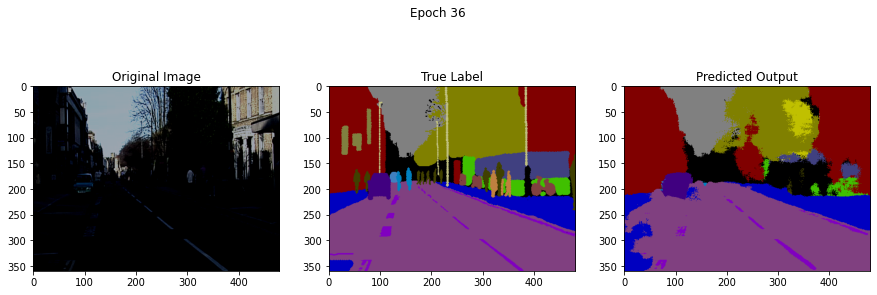

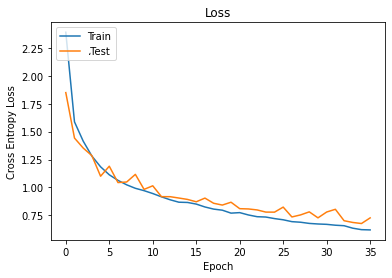

**********Epoch: 37 **********
 Epoch 37,  Iteration     9,  Loss: 0.541
 Epoch 37,  Iteration    19,  Loss: 0.630
 Epoch 37,  Iteration    29,  Loss: 0.622
 Epoch 37,  Iteration    39,  Loss: 0.615
 Epoch 37,  Iteration    49,  Loss: 0.626
 Epoch 37,  Iteration    59,  Loss: 0.626
 Epoch 37,  Iteration    69,  Loss: 0.618
 Epoch 37,  Iteration    79,  Loss: 0.614
 Epoch 37,  Iteration    89,  Loss: 0.610
 Epoch 37,  Iteration    99,  Loss: 0.607
 Epoch 37,  Iteration   109,  Loss: 0.612
 Epoch 37,  Iteration   119,  Loss: 0.612
 Epoch 37,  Iteration   129,  Loss: 0.610
 Epoch 37,  Iteration   139,  Loss: 0.612
TestLoss:  0.6966531864470906


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


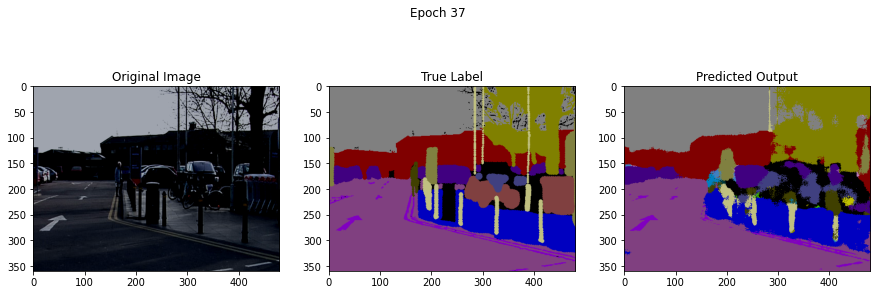

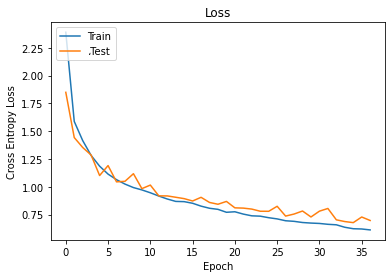

**********Epoch: 38 **********
 Epoch 38,  Iteration     9,  Loss: 0.681
 Epoch 38,  Iteration    19,  Loss: 0.659
 Epoch 38,  Iteration    29,  Loss: 0.655
 Epoch 38,  Iteration    39,  Loss: 0.629
 Epoch 38,  Iteration    49,  Loss: 0.619
 Epoch 38,  Iteration    59,  Loss: 0.618
 Epoch 38,  Iteration    69,  Loss: 0.622
 Epoch 38,  Iteration    79,  Loss: 0.631
 Epoch 38,  Iteration    89,  Loss: 0.631
 Epoch 38,  Iteration    99,  Loss: 0.625
 Epoch 38,  Iteration   109,  Loss: 0.619
 Epoch 38,  Iteration   119,  Loss: 0.615
 Epoch 38,  Iteration   129,  Loss: 0.610
 Epoch 38,  Iteration   139,  Loss: 0.614
TestLoss:  0.6963921793633037


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


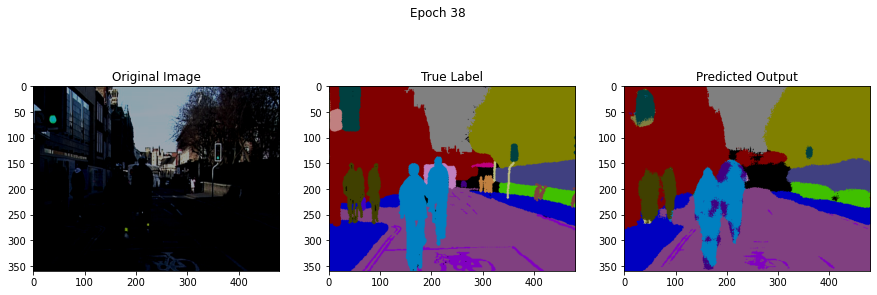

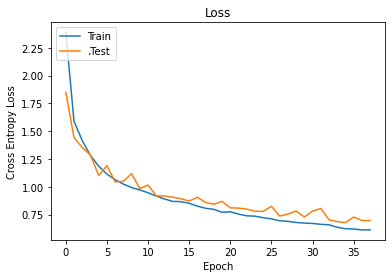

**********Epoch: 39 **********
 Epoch 39,  Iteration     9,  Loss: 0.605
 Epoch 39,  Iteration    19,  Loss: 0.622
 Epoch 39,  Iteration    29,  Loss: 0.607
 Epoch 39,  Iteration    39,  Loss: 0.607
 Epoch 39,  Iteration    49,  Loss: 0.605
 Epoch 39,  Iteration    59,  Loss: 0.600
 Epoch 39,  Iteration    69,  Loss: 0.602
 Epoch 39,  Iteration    79,  Loss: 0.608
 Epoch 39,  Iteration    89,  Loss: 0.612
 Epoch 39,  Iteration    99,  Loss: 0.618
 Epoch 39,  Iteration   109,  Loss: 0.615
 Epoch 39,  Iteration   119,  Loss: 0.612
 Epoch 39,  Iteration   129,  Loss: 0.608
 Epoch 39,  Iteration   139,  Loss: 0.604
TestLoss:  0.6892460005150901


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


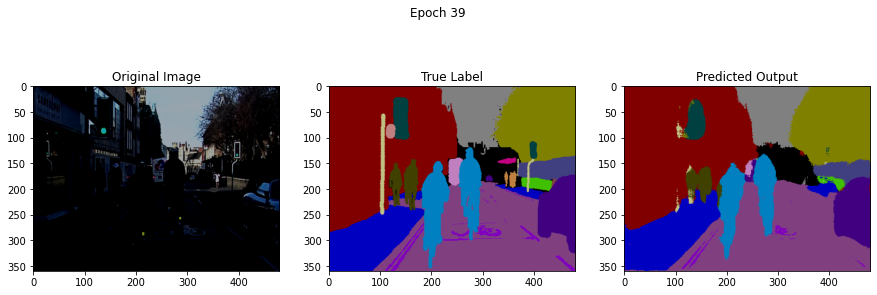

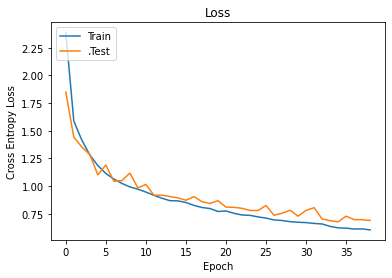

**********Epoch: 40 **********
 Epoch 40,  Iteration     9,  Loss: 0.549
 Epoch 40,  Iteration    19,  Loss: 0.567
 Epoch 40,  Iteration    29,  Loss: 0.559
 Epoch 40,  Iteration    39,  Loss: 0.566
 Epoch 40,  Iteration    49,  Loss: 0.575
 Epoch 40,  Iteration    59,  Loss: 0.580
 Epoch 40,  Iteration    69,  Loss: 0.582
 Epoch 40,  Iteration    79,  Loss: 0.577
 Epoch 40,  Iteration    89,  Loss: 0.584
 Epoch 40,  Iteration    99,  Loss: 0.585
 Epoch 40,  Iteration   109,  Loss: 0.587
 Epoch 40,  Iteration   119,  Loss: 0.591
 Epoch 40,  Iteration   129,  Loss: 0.590
 Epoch 40,  Iteration   139,  Loss: 0.591
TestLoss:  0.7280688103702333


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


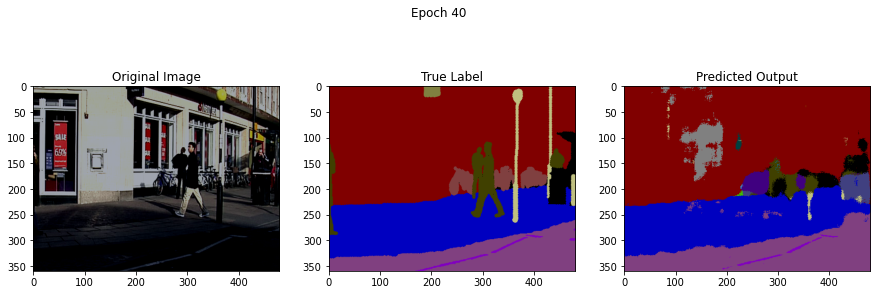

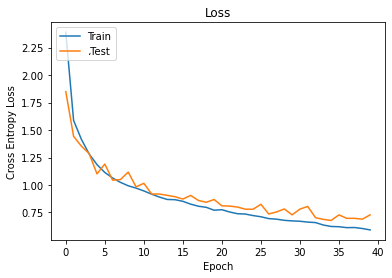

**********Epoch: 41 **********
 Epoch 41,  Iteration     9,  Loss: 0.623
 Epoch 41,  Iteration    19,  Loss: 0.599
 Epoch 41,  Iteration    29,  Loss: 0.588
 Epoch 41,  Iteration    39,  Loss: 0.585
 Epoch 41,  Iteration    49,  Loss: 0.575
 Epoch 41,  Iteration    59,  Loss: 0.577
 Epoch 41,  Iteration    69,  Loss: 0.581
 Epoch 41,  Iteration    79,  Loss: 0.580
 Epoch 41,  Iteration    89,  Loss: 0.586
 Epoch 41,  Iteration    99,  Loss: 0.592
 Epoch 41,  Iteration   109,  Loss: 0.589
 Epoch 41,  Iteration   119,  Loss: 0.592
 Epoch 41,  Iteration   129,  Loss: 0.592
 Epoch 41,  Iteration   139,  Loss: 0.589
TestLoss:  0.6647973913285468


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


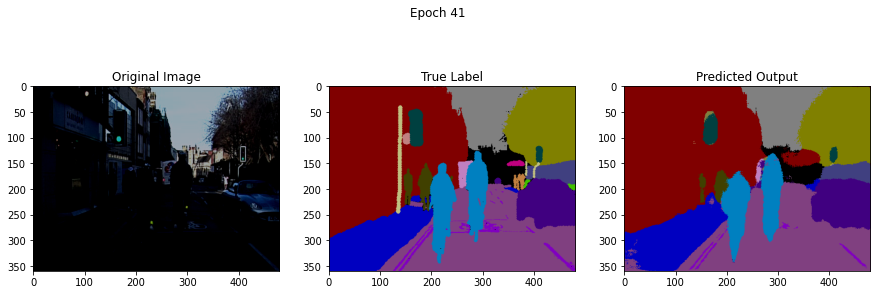

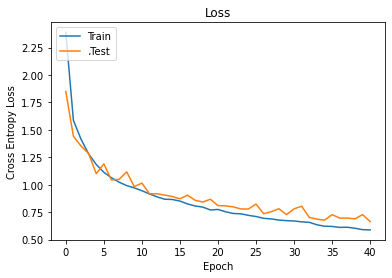

**********Epoch: 42 **********
 Epoch 42,  Iteration     9,  Loss: 0.581
 Epoch 42,  Iteration    19,  Loss: 0.562
 Epoch 42,  Iteration    29,  Loss: 0.568
 Epoch 42,  Iteration    39,  Loss: 0.561
 Epoch 42,  Iteration    49,  Loss: 0.578
 Epoch 42,  Iteration    59,  Loss: 0.585
 Epoch 42,  Iteration    69,  Loss: 0.587
 Epoch 42,  Iteration    79,  Loss: 0.587
 Epoch 42,  Iteration    89,  Loss: 0.590
 Epoch 42,  Iteration    99,  Loss: 0.584
 Epoch 42,  Iteration   109,  Loss: 0.578
 Epoch 42,  Iteration   119,  Loss: 0.581
 Epoch 42,  Iteration   129,  Loss: 0.578
 Epoch 42,  Iteration   139,  Loss: 0.577
TestLoss:  0.6689812690019608


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


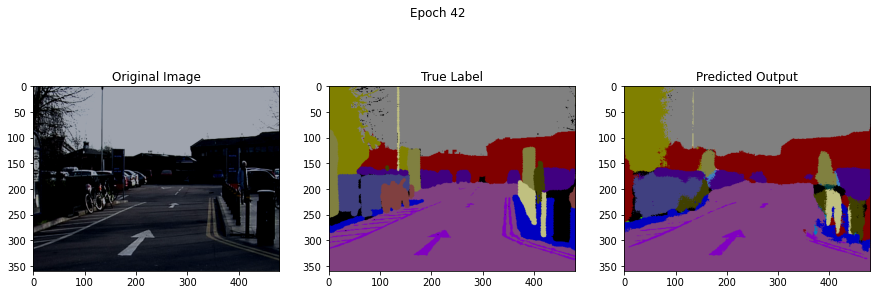

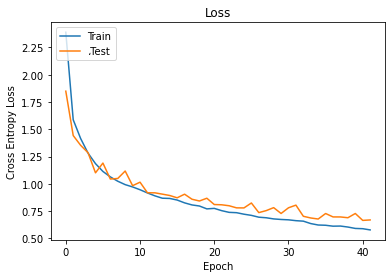

**********Epoch: 43 **********
 Epoch 43,  Iteration     9,  Loss: 0.615
 Epoch 43,  Iteration    19,  Loss: 0.597
 Epoch 43,  Iteration    29,  Loss: 0.594
 Epoch 43,  Iteration    39,  Loss: 0.578
 Epoch 43,  Iteration    49,  Loss: 0.562
 Epoch 43,  Iteration    59,  Loss: 0.571
 Epoch 43,  Iteration    69,  Loss: 0.567
 Epoch 43,  Iteration    79,  Loss: 0.566
 Epoch 43,  Iteration    89,  Loss: 0.564
 Epoch 43,  Iteration    99,  Loss: 0.560
 Epoch 43,  Iteration   109,  Loss: 0.566
 Epoch 43,  Iteration   119,  Loss: 0.568
 Epoch 43,  Iteration   129,  Loss: 0.572
 Epoch 43,  Iteration   139,  Loss: 0.576
TestLoss:  0.6972401473257277


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


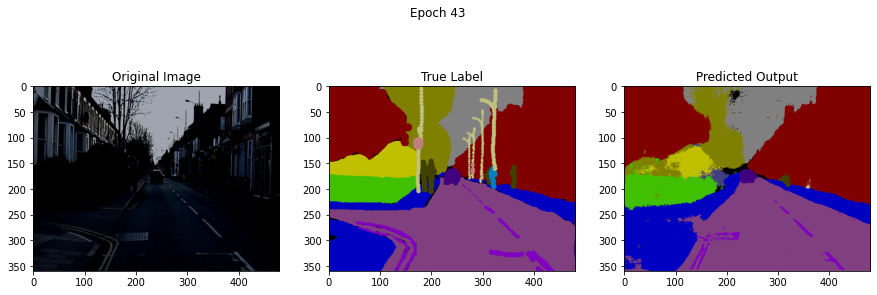

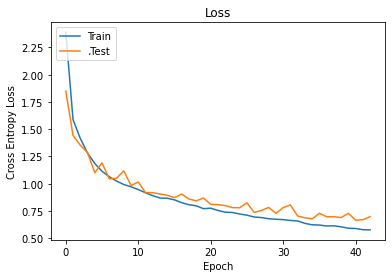

**********Epoch: 44 **********
 Epoch 44,  Iteration     9,  Loss: 0.549
 Epoch 44,  Iteration    19,  Loss: 0.594
 Epoch 44,  Iteration    29,  Loss: 0.581
 Epoch 44,  Iteration    39,  Loss: 0.575
 Epoch 44,  Iteration    49,  Loss: 0.575
 Epoch 44,  Iteration    59,  Loss: 0.571
 Epoch 44,  Iteration    69,  Loss: 0.568
 Epoch 44,  Iteration    79,  Loss: 0.566
 Epoch 44,  Iteration    89,  Loss: 0.566
 Epoch 44,  Iteration    99,  Loss: 0.562
 Epoch 44,  Iteration   109,  Loss: 0.561
 Epoch 44,  Iteration   119,  Loss: 0.565
 Epoch 44,  Iteration   129,  Loss: 0.562
 Epoch 44,  Iteration   139,  Loss: 0.569
TestLoss:  0.7167274554570516


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


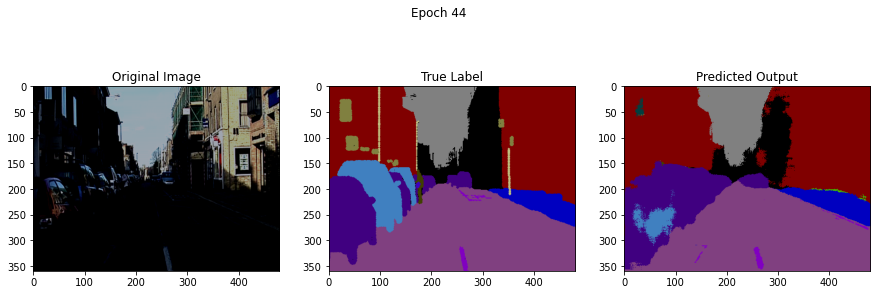

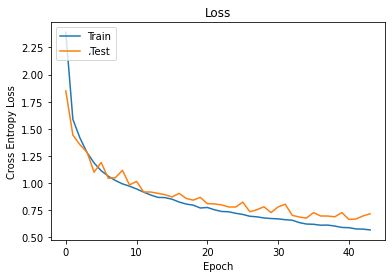

**********Epoch: 45 **********
 Epoch 45,  Iteration     9,  Loss: 0.586
 Epoch 45,  Iteration    19,  Loss: 0.596
 Epoch 45,  Iteration    29,  Loss: 0.585
 Epoch 45,  Iteration    39,  Loss: 0.576
 Epoch 45,  Iteration    49,  Loss: 0.565
 Epoch 45,  Iteration    59,  Loss: 0.565
 Epoch 45,  Iteration    69,  Loss: 0.559
 Epoch 45,  Iteration    79,  Loss: 0.561
 Epoch 45,  Iteration    89,  Loss: 0.567
 Epoch 45,  Iteration    99,  Loss: 0.570
 Epoch 45,  Iteration   109,  Loss: 0.572
 Epoch 45,  Iteration   119,  Loss: 0.575
 Epoch 45,  Iteration   129,  Loss: 0.578
 Epoch 45,  Iteration   139,  Loss: 0.586
TestLoss:  0.7634734908739725


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


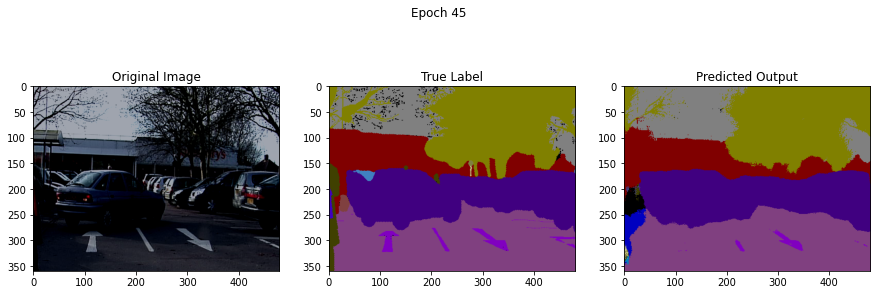

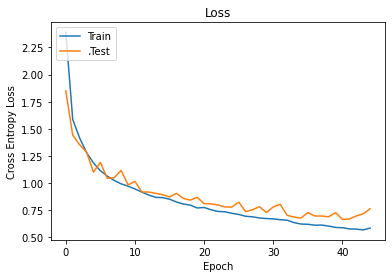

**********Epoch: 46 **********
 Epoch 46,  Iteration     9,  Loss: 0.638
 Epoch 46,  Iteration    19,  Loss: 0.604
 Epoch 46,  Iteration    29,  Loss: 0.578
 Epoch 46,  Iteration    39,  Loss: 0.573
 Epoch 46,  Iteration    49,  Loss: 0.579
 Epoch 46,  Iteration    59,  Loss: 0.579
 Epoch 46,  Iteration    69,  Loss: 0.587
 Epoch 46,  Iteration    79,  Loss: 0.581
 Epoch 46,  Iteration    89,  Loss: 0.579
 Epoch 46,  Iteration    99,  Loss: 0.573
 Epoch 46,  Iteration   109,  Loss: 0.568
 Epoch 46,  Iteration   119,  Loss: 0.565
 Epoch 46,  Iteration   129,  Loss: 0.562
 Epoch 46,  Iteration   139,  Loss: 0.561
TestLoss:  0.6738024652004242


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


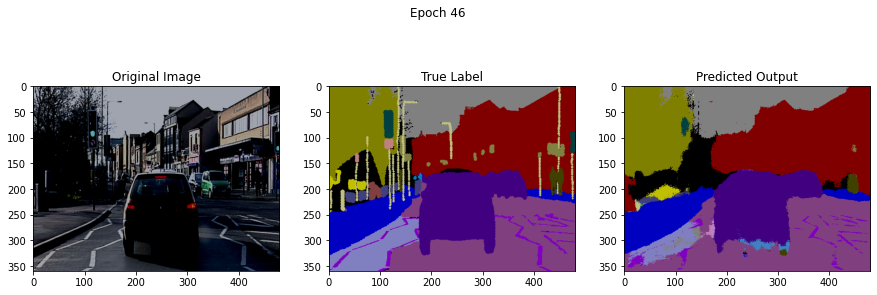

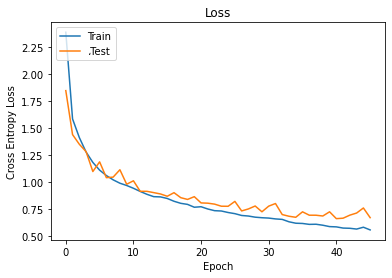

**********Epoch: 47 **********
 Epoch 47,  Iteration     9,  Loss: 0.504
 Epoch 47,  Iteration    19,  Loss: 0.528
 Epoch 47,  Iteration    29,  Loss: 0.529
 Epoch 47,  Iteration    39,  Loss: 0.520
 Epoch 47,  Iteration    49,  Loss: 0.527
 Epoch 47,  Iteration    59,  Loss: 0.527
 Epoch 47,  Iteration    69,  Loss: 0.533
 Epoch 47,  Iteration    79,  Loss: 0.538
 Epoch 47,  Iteration    89,  Loss: 0.540
 Epoch 47,  Iteration    99,  Loss: 0.548
 Epoch 47,  Iteration   109,  Loss: 0.548
 Epoch 47,  Iteration   119,  Loss: 0.550
 Epoch 47,  Iteration   129,  Loss: 0.549
 Epoch 47,  Iteration   139,  Loss: 0.554
TestLoss:  0.6319602305690447


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


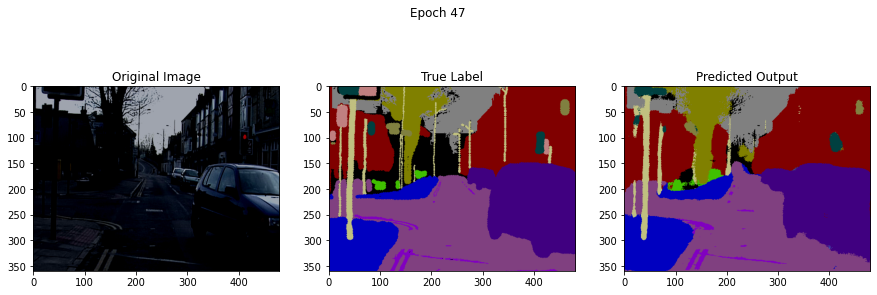

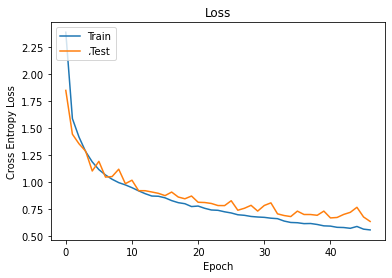

**********Epoch: 48 **********
 Epoch 48,  Iteration     9,  Loss: 0.534
 Epoch 48,  Iteration    19,  Loss: 0.529
 Epoch 48,  Iteration    29,  Loss: 0.510
 Epoch 48,  Iteration    39,  Loss: 0.505
 Epoch 48,  Iteration    49,  Loss: 0.506
 Epoch 48,  Iteration    59,  Loss: 0.514
 Epoch 48,  Iteration    69,  Loss: 0.525
 Epoch 48,  Iteration    79,  Loss: 0.537
 Epoch 48,  Iteration    89,  Loss: 0.542
 Epoch 48,  Iteration    99,  Loss: 0.545
 Epoch 48,  Iteration   109,  Loss: 0.548
 Epoch 48,  Iteration   119,  Loss: 0.546
 Epoch 48,  Iteration   129,  Loss: 0.548
 Epoch 48,  Iteration   139,  Loss: 0.548
TestLoss:  0.718691756327947


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


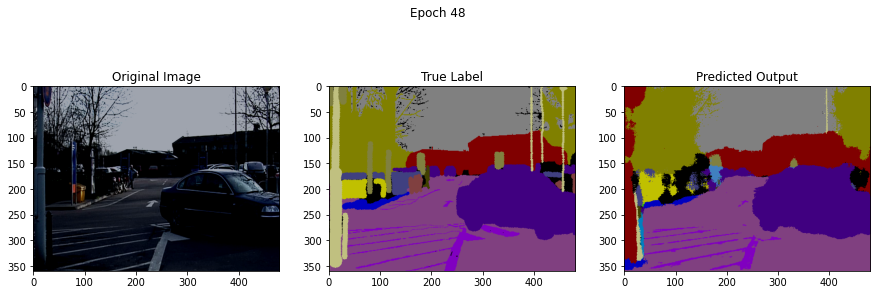

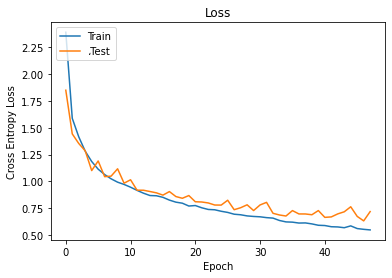

**********Epoch: 49 **********
 Epoch 49,  Iteration     9,  Loss: 0.610
 Epoch 49,  Iteration    19,  Loss: 0.584
 Epoch 49,  Iteration    29,  Loss: 0.563
 Epoch 49,  Iteration    39,  Loss: 0.555
 Epoch 49,  Iteration    49,  Loss: 0.546
 Epoch 49,  Iteration    59,  Loss: 0.554
 Epoch 49,  Iteration    69,  Loss: 0.554
 Epoch 49,  Iteration    79,  Loss: 0.548
 Epoch 49,  Iteration    89,  Loss: 0.545
 Epoch 49,  Iteration    99,  Loss: 0.543
 Epoch 49,  Iteration   109,  Loss: 0.544
 Epoch 49,  Iteration   119,  Loss: 0.544
 Epoch 49,  Iteration   129,  Loss: 0.546
 Epoch 49,  Iteration   139,  Loss: 0.549
TestLoss:  0.6843471311860614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


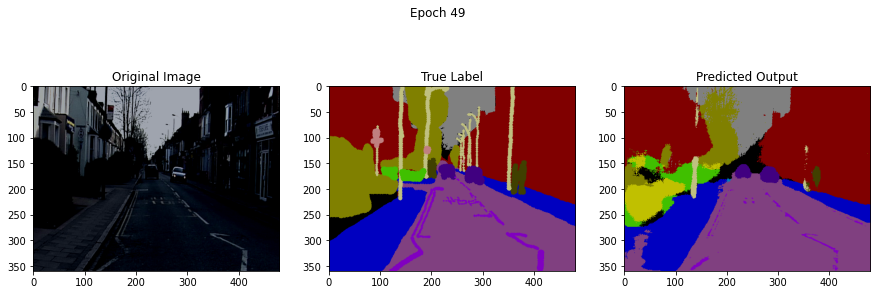

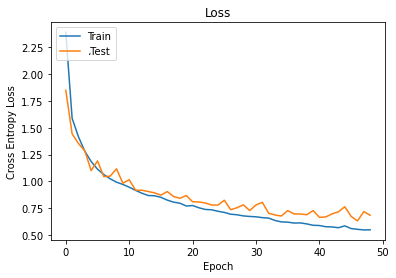

**********Epoch: 50 **********
 Epoch 50,  Iteration     9,  Loss: 0.549
 Epoch 50,  Iteration    19,  Loss: 0.531
 Epoch 50,  Iteration    29,  Loss: 0.528
 Epoch 50,  Iteration    39,  Loss: 0.520
 Epoch 50,  Iteration    49,  Loss: 0.520
 Epoch 50,  Iteration    59,  Loss: 0.515
 Epoch 50,  Iteration    69,  Loss: 0.509
 Epoch 50,  Iteration    79,  Loss: 0.510
 Epoch 50,  Iteration    89,  Loss: 0.513
 Epoch 50,  Iteration    99,  Loss: 0.521
 Epoch 50,  Iteration   109,  Loss: 0.522
 Epoch 50,  Iteration   119,  Loss: 0.530
 Epoch 50,  Iteration   129,  Loss: 0.531
 Epoch 50,  Iteration   139,  Loss: 0.533
TestLoss:  0.6441824345125092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


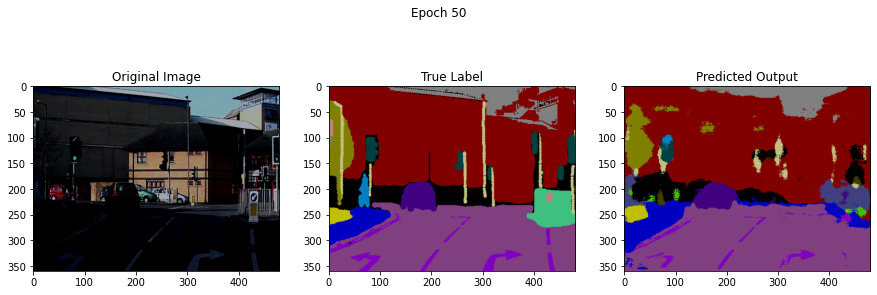

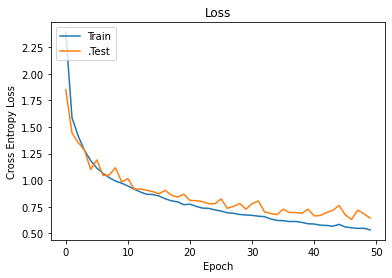

**********Epoch: 51 **********
 Epoch 51,  Iteration     9,  Loss: 0.577
 Epoch 51,  Iteration    19,  Loss: 0.572
 Epoch 51,  Iteration    29,  Loss: 0.550
 Epoch 51,  Iteration    39,  Loss: 0.549
 Epoch 51,  Iteration    49,  Loss: 0.540
 Epoch 51,  Iteration    59,  Loss: 0.542
 Epoch 51,  Iteration    69,  Loss: 0.531
 Epoch 51,  Iteration    79,  Loss: 0.533
 Epoch 51,  Iteration    89,  Loss: 0.539
 Epoch 51,  Iteration    99,  Loss: 0.539
 Epoch 51,  Iteration   109,  Loss: 0.538
 Epoch 51,  Iteration   119,  Loss: 0.540
 Epoch 51,  Iteration   129,  Loss: 0.542
 Epoch 51,  Iteration   139,  Loss: 0.544
TestLoss:  0.7186851170327928


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


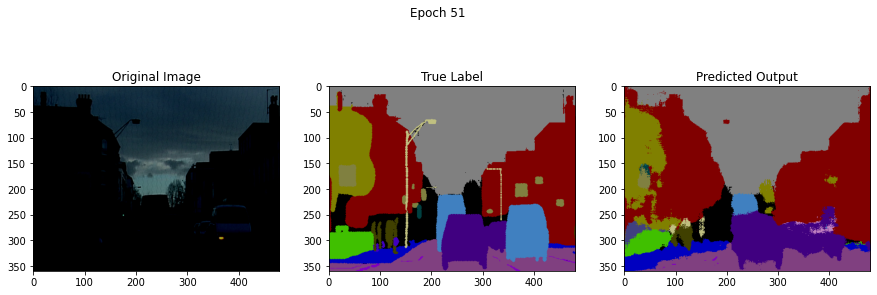

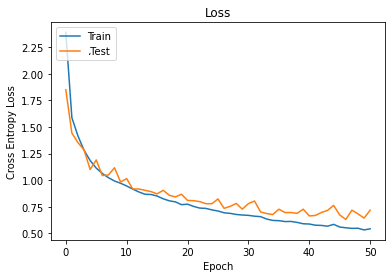

**********Epoch: 52 **********
 Epoch 52,  Iteration     9,  Loss: 0.484
 Epoch 52,  Iteration    19,  Loss: 0.496
 Epoch 52,  Iteration    29,  Loss: 0.496
 Epoch 52,  Iteration    39,  Loss: 0.521
 Epoch 52,  Iteration    49,  Loss: 0.521
 Epoch 52,  Iteration    59,  Loss: 0.521
 Epoch 52,  Iteration    69,  Loss: 0.523
 Epoch 52,  Iteration    79,  Loss: 0.516
 Epoch 52,  Iteration    89,  Loss: 0.521
 Epoch 52,  Iteration    99,  Loss: 0.520
 Epoch 52,  Iteration   109,  Loss: 0.528
 Epoch 52,  Iteration   119,  Loss: 0.524
 Epoch 52,  Iteration   129,  Loss: 0.525
 Epoch 52,  Iteration   139,  Loss: 0.524
TestLoss:  0.6347518248690499


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


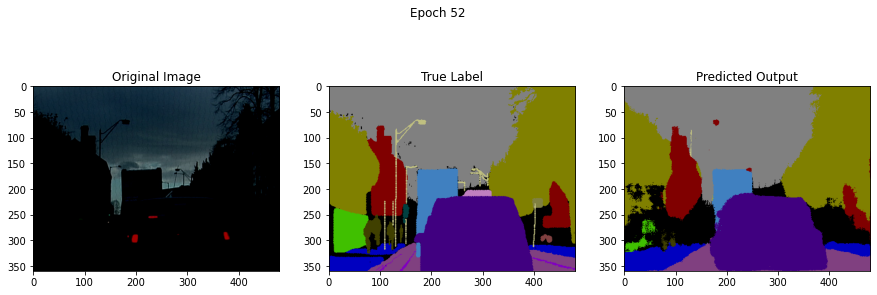

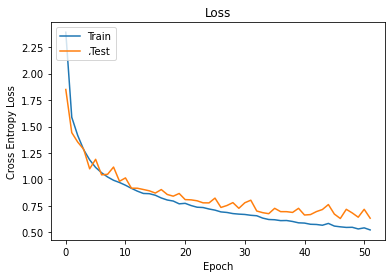

**********Epoch: 53 **********
 Epoch 53,  Iteration     9,  Loss: 0.523
 Epoch 53,  Iteration    19,  Loss: 0.501
 Epoch 53,  Iteration    29,  Loss: 0.487
 Epoch 53,  Iteration    39,  Loss: 0.494
 Epoch 53,  Iteration    49,  Loss: 0.495
 Epoch 53,  Iteration    59,  Loss: 0.493
 Epoch 53,  Iteration    69,  Loss: 0.500
 Epoch 53,  Iteration    79,  Loss: 0.512
 Epoch 53,  Iteration    89,  Loss: 0.522
 Epoch 53,  Iteration    99,  Loss: 0.527
 Epoch 53,  Iteration   109,  Loss: 0.529
 Epoch 53,  Iteration   119,  Loss: 0.528
 Epoch 53,  Iteration   129,  Loss: 0.526
 Epoch 53,  Iteration   139,  Loss: 0.530
TestLoss:  0.6370185870263312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


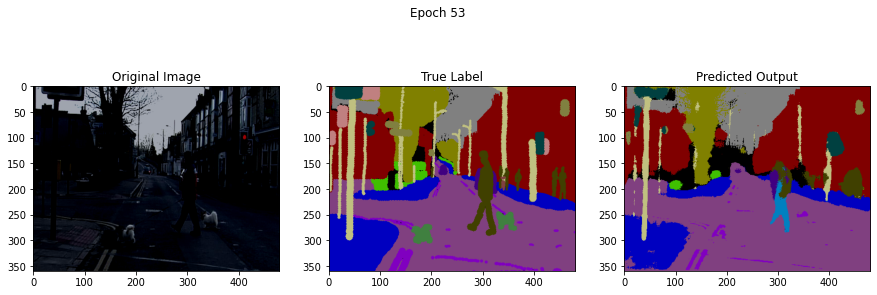

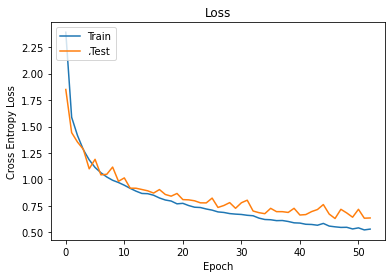

**********Epoch: 54 **********
 Epoch 54,  Iteration     9,  Loss: 0.485
 Epoch 54,  Iteration    19,  Loss: 0.481
 Epoch 54,  Iteration    29,  Loss: 0.495
 Epoch 54,  Iteration    39,  Loss: 0.510
 Epoch 54,  Iteration    49,  Loss: 0.513
 Epoch 54,  Iteration    59,  Loss: 0.525
 Epoch 54,  Iteration    69,  Loss: 0.529
 Epoch 54,  Iteration    79,  Loss: 0.527
 Epoch 54,  Iteration    89,  Loss: 0.531
 Epoch 54,  Iteration    99,  Loss: 0.530
 Epoch 54,  Iteration   109,  Loss: 0.526
 Epoch 54,  Iteration   119,  Loss: 0.525
 Epoch 54,  Iteration   129,  Loss: 0.527
 Epoch 54,  Iteration   139,  Loss: 0.525
TestLoss:  0.6380456843309932


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


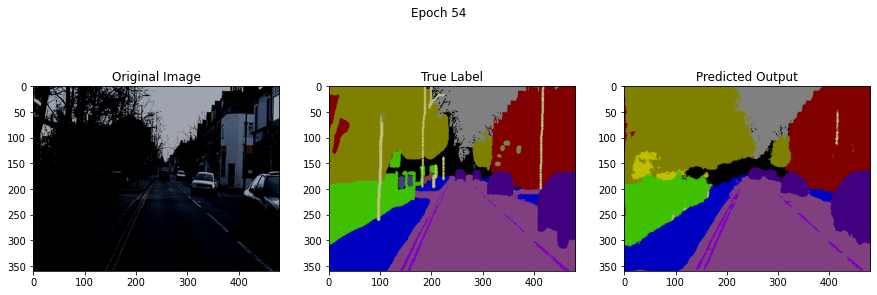

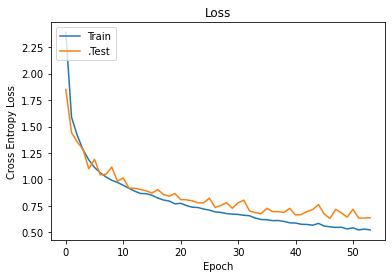

**********Epoch: 55 **********
 Epoch 55,  Iteration     9,  Loss: 0.475
 Epoch 55,  Iteration    19,  Loss: 0.473
 Epoch 55,  Iteration    29,  Loss: 0.485
 Epoch 55,  Iteration    39,  Loss: 0.490
 Epoch 55,  Iteration    49,  Loss: 0.487
 Epoch 55,  Iteration    59,  Loss: 0.494
 Epoch 55,  Iteration    69,  Loss: 0.493
 Epoch 55,  Iteration    79,  Loss: 0.492
 Epoch 55,  Iteration    89,  Loss: 0.495
 Epoch 55,  Iteration    99,  Loss: 0.497
 Epoch 55,  Iteration   109,  Loss: 0.502
 Epoch 55,  Iteration   119,  Loss: 0.509
 Epoch 55,  Iteration   129,  Loss: 0.517
 Epoch 55,  Iteration   139,  Loss: 0.520
TestLoss:  0.7126961573958397


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


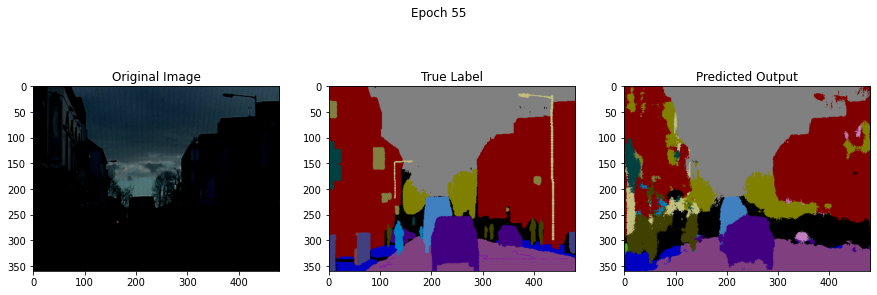

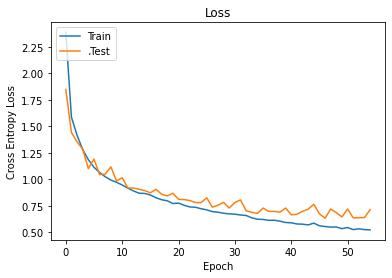

**********Epoch: 56 **********
 Epoch 56,  Iteration     9,  Loss: 0.508
 Epoch 56,  Iteration    19,  Loss: 0.495
 Epoch 56,  Iteration    29,  Loss: 0.495
 Epoch 56,  Iteration    39,  Loss: 0.497
 Epoch 56,  Iteration    49,  Loss: 0.494
 Epoch 56,  Iteration    59,  Loss: 0.492
 Epoch 56,  Iteration    69,  Loss: 0.504
 Epoch 56,  Iteration    79,  Loss: 0.509
 Epoch 56,  Iteration    89,  Loss: 0.512
 Epoch 56,  Iteration    99,  Loss: 0.510
 Epoch 56,  Iteration   109,  Loss: 0.510
 Epoch 56,  Iteration   119,  Loss: 0.506
 Epoch 56,  Iteration   129,  Loss: 0.511
 Epoch 56,  Iteration   139,  Loss: 0.515
TestLoss:  0.6406533825728629


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


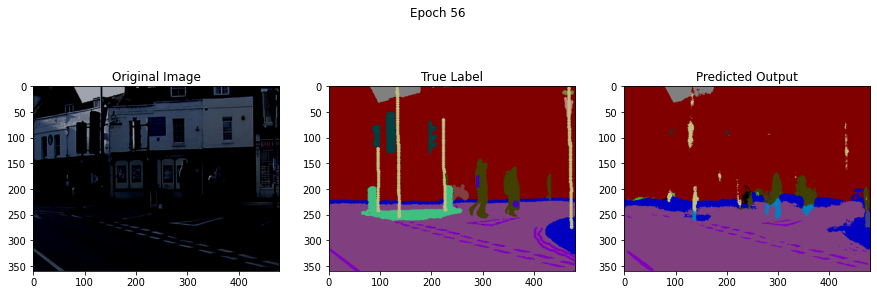

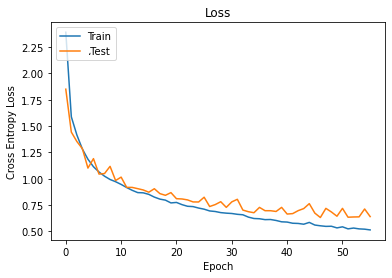

**********Epoch: 57 **********
 Epoch 57,  Iteration     9,  Loss: 0.532
 Epoch 57,  Iteration    19,  Loss: 0.525
 Epoch 57,  Iteration    29,  Loss: 0.543
 Epoch 57,  Iteration    39,  Loss: 0.548
 Epoch 57,  Iteration    49,  Loss: 0.542
 Epoch 57,  Iteration    59,  Loss: 0.533
 Epoch 57,  Iteration    69,  Loss: 0.526
 Epoch 57,  Iteration    79,  Loss: 0.513
 Epoch 57,  Iteration    89,  Loss: 0.510
 Epoch 57,  Iteration    99,  Loss: 0.511
 Epoch 57,  Iteration   109,  Loss: 0.512
 Epoch 57,  Iteration   119,  Loss: 0.512
 Epoch 57,  Iteration   129,  Loss: 0.510
 Epoch 57,  Iteration   139,  Loss: 0.512
TestLoss:  0.6251685760087438


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


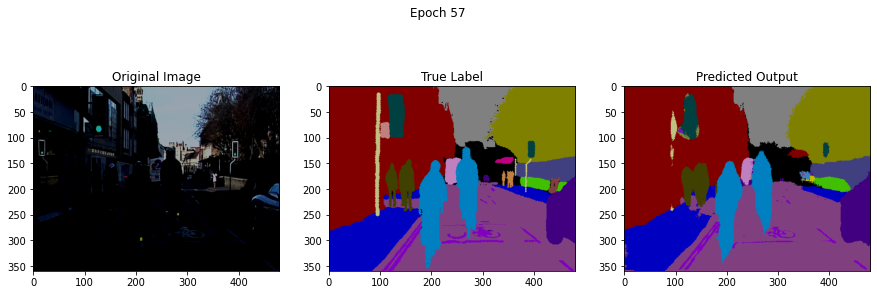

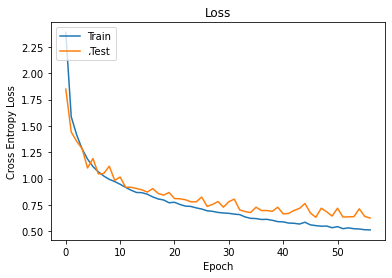

**********Epoch: 58 **********
 Epoch 58,  Iteration     9,  Loss: 0.591
 Epoch 58,  Iteration    19,  Loss: 0.527
 Epoch 58,  Iteration    29,  Loss: 0.514
 Epoch 58,  Iteration    39,  Loss: 0.507
 Epoch 58,  Iteration    49,  Loss: 0.505
 Epoch 58,  Iteration    59,  Loss: 0.504
 Epoch 58,  Iteration    69,  Loss: 0.504
 Epoch 58,  Iteration    79,  Loss: 0.502
 Epoch 58,  Iteration    89,  Loss: 0.505
 Epoch 58,  Iteration    99,  Loss: 0.507
 Epoch 58,  Iteration   109,  Loss: 0.510
 Epoch 58,  Iteration   119,  Loss: 0.513
 Epoch 58,  Iteration   129,  Loss: 0.514
 Epoch 58,  Iteration   139,  Loss: 0.512
TestLoss:  0.6287953390015496


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


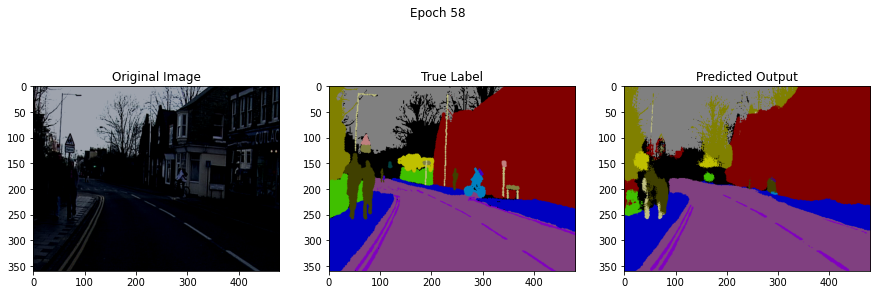

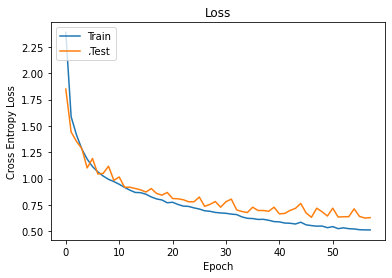

**********Epoch: 59 **********
 Epoch 59,  Iteration     9,  Loss: 0.442
 Epoch 59,  Iteration    19,  Loss: 0.480
 Epoch 59,  Iteration    29,  Loss: 0.506
 Epoch 59,  Iteration    39,  Loss: 0.502
 Epoch 59,  Iteration    49,  Loss: 0.499
 Epoch 59,  Iteration    59,  Loss: 0.500
 Epoch 59,  Iteration    69,  Loss: 0.500
 Epoch 59,  Iteration    79,  Loss: 0.497
 Epoch 59,  Iteration    89,  Loss: 0.500
 Epoch 59,  Iteration    99,  Loss: 0.504
 Epoch 59,  Iteration   109,  Loss: 0.502
 Epoch 59,  Iteration   119,  Loss: 0.506
 Epoch 59,  Iteration   129,  Loss: 0.503
 Epoch 59,  Iteration   139,  Loss: 0.503
TestLoss:  0.6291424557566643


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


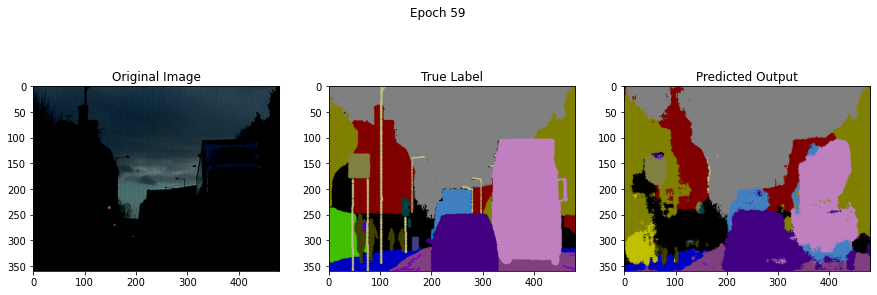

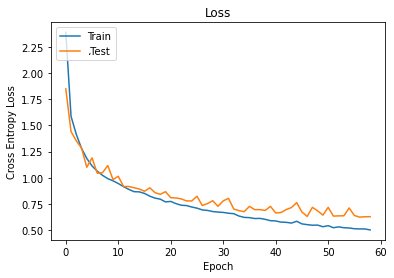

**********Epoch: 60 **********
 Epoch 60,  Iteration     9,  Loss: 0.489
 Epoch 60,  Iteration    19,  Loss: 0.510
 Epoch 60,  Iteration    29,  Loss: 0.504
 Epoch 60,  Iteration    39,  Loss: 0.496
 Epoch 60,  Iteration    49,  Loss: 0.484
 Epoch 60,  Iteration    59,  Loss: 0.477
 Epoch 60,  Iteration    69,  Loss: 0.488
 Epoch 60,  Iteration    79,  Loss: 0.486
 Epoch 60,  Iteration    89,  Loss: 0.488
 Epoch 60,  Iteration    99,  Loss: 0.485
 Epoch 60,  Iteration   109,  Loss: 0.483
 Epoch 60,  Iteration   119,  Loss: 0.485
 Epoch 60,  Iteration   129,  Loss: 0.486
 Epoch 60,  Iteration   139,  Loss: 0.491
TestLoss:  0.6611454900768068


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


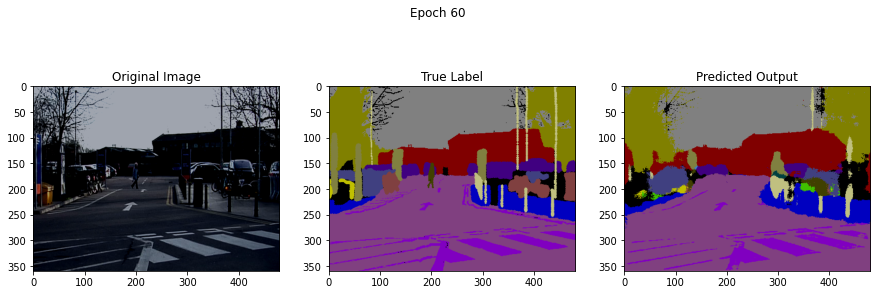

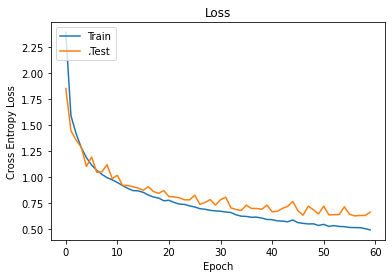

Finished Training


In [15]:
for epoch in range(60):  # loop over the dataset multiple times
  print("**********Epoch:",epoch+1,"**********")
  lossEpoch = 0.0
  cnt = 0
  running_loss = 0.0
  net = net.train()
  for imData, imLabel in trainDataCamvid:
    cnt = cnt +1
    if torch.cuda.is_available:
      img = gradEnb(imData).cuda()
      imLabel =  gradEnb(imLabel).cuda()
    else:
      img = Variable(img)
      imLabel = Variable(imLabel)
    outputs = net(img)
    # forward + backward + optimize
    outputs = net(img)
    imLabel_Clnmb = torch.argmax(imLabel, dim=1)
    loss = criterion(outputs, imLabel_Clnmb)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
  # print statistics
    running_loss += loss.item()
    if cnt % 10 == 9:    
        print(' Epoch %d,  Iteration %5d,  Loss: %.3f' %
              (epoch + 1, cnt, running_loss /(cnt)))
        
  testLoss = calcTestLoss(testDataCamvid, net, criterion)
  print("TestLoss: ", testLoss)
  showResults(epoch_ = epoch+1, originalImg = img.cpu().numpy(), label = imLabel.cpu().numpy(), predictedResult = outputs.cpu())
  lossTrainHist.append(running_loss/cnt)
  lossTestHist.append(testLoss)
  epochHist.append(epoch)
  plotLoss(epochHist, lossTrainHist, lossTestHist)

  
    
            
          

print('Finished Training')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


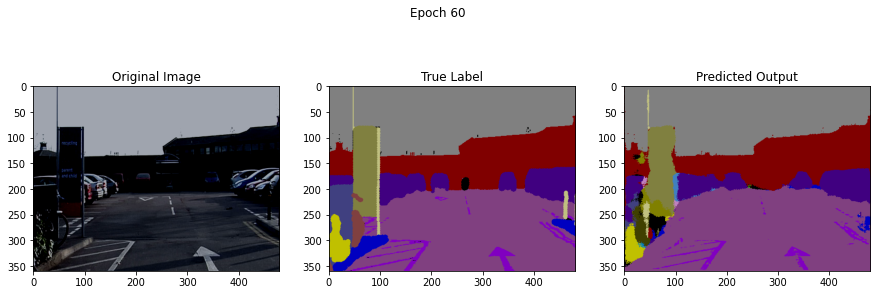

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


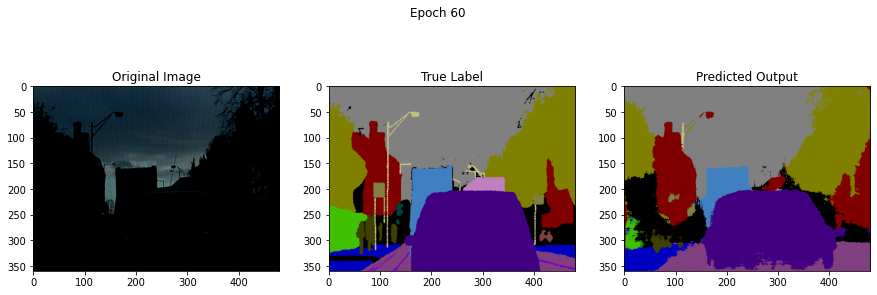

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


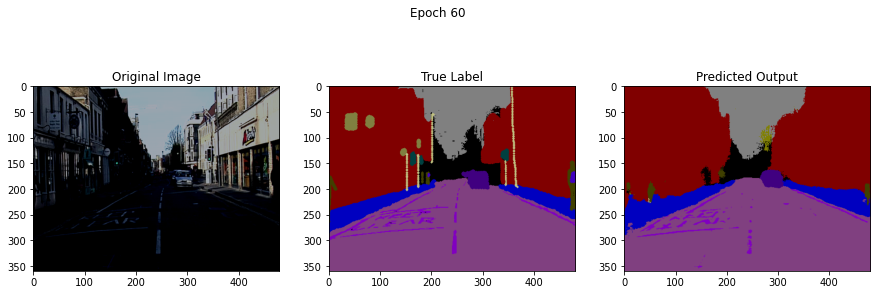

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


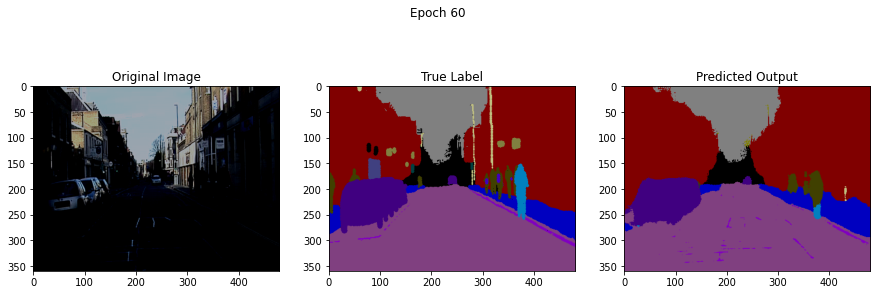

In [19]:
with torch.no_grad():
    i = 0
    for img,  imLabel in testDataCamvid:
      i +=1
      if torch.cuda.is_available:
        img = img.cuda()
        imLabel =  imLabel.cuda()
      outputs = net(img)
      showResults(epoch_ = epoch+1, originalImg = img.cpu().numpy(), label = imLabel.cpu().numpy(), predictedResult = outputs.cpu())
      if i% 5 == 4:
        break
      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


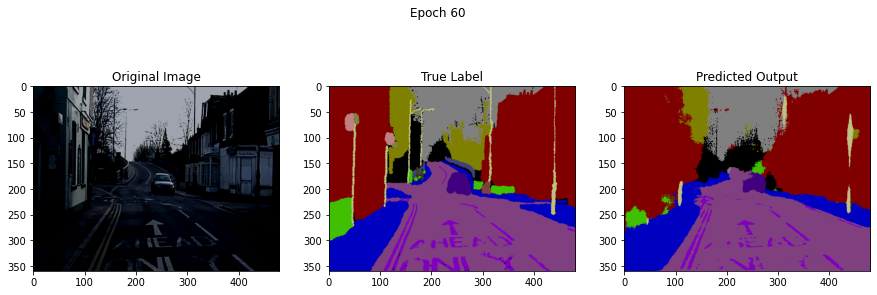

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


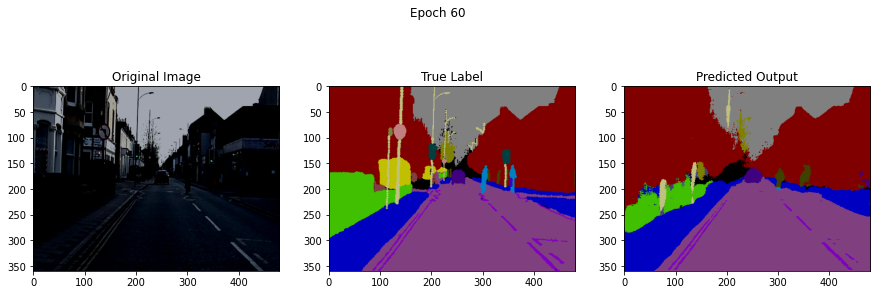

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


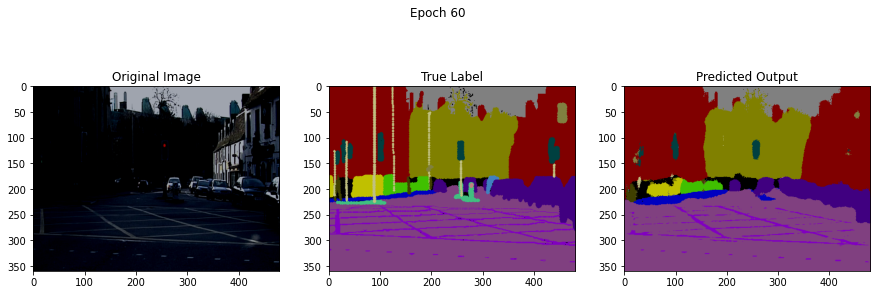

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


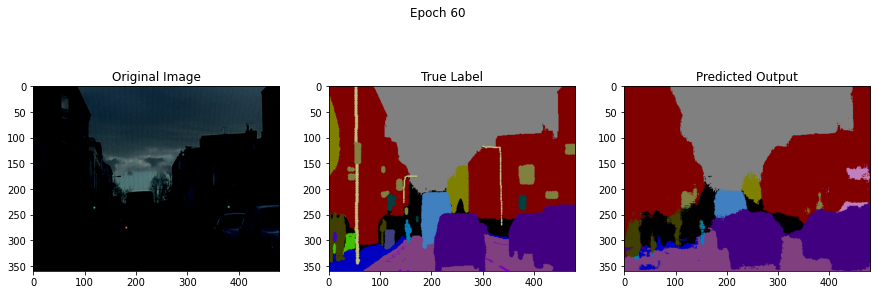

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


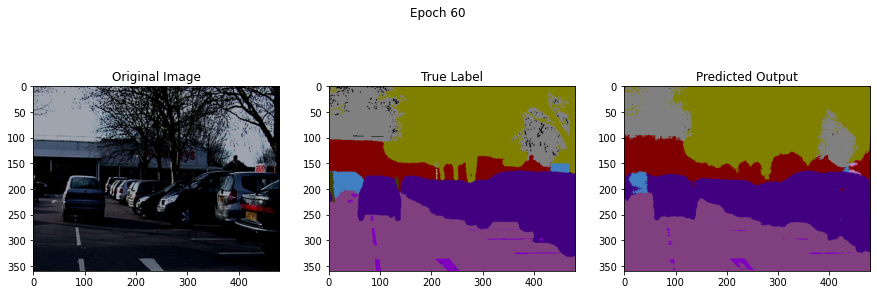

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


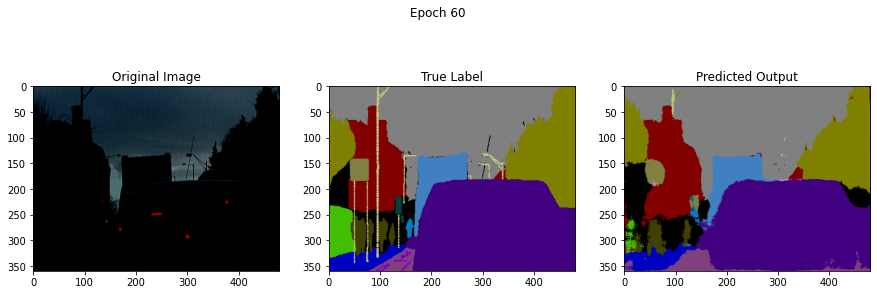

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


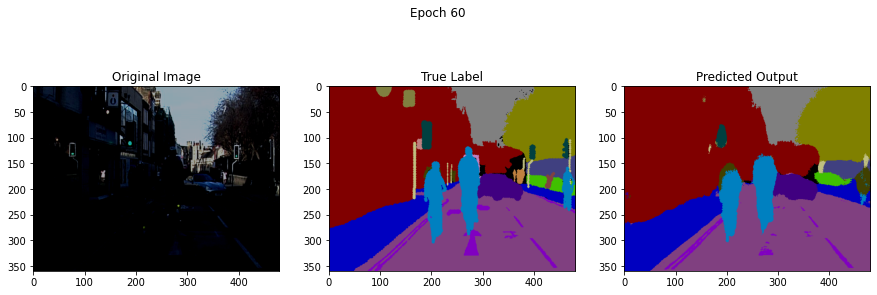

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


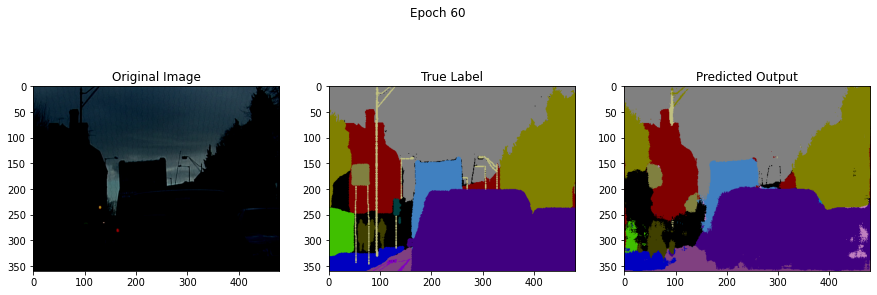

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


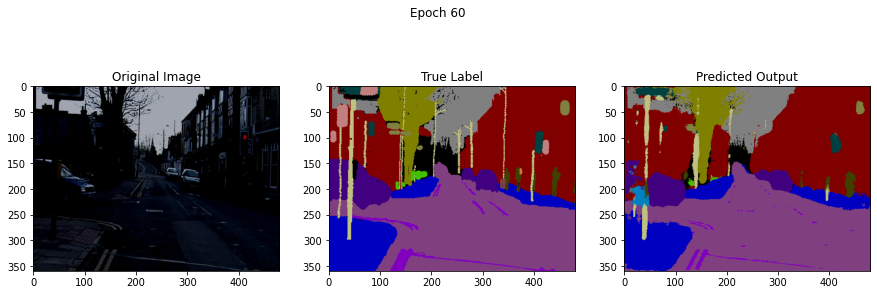

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


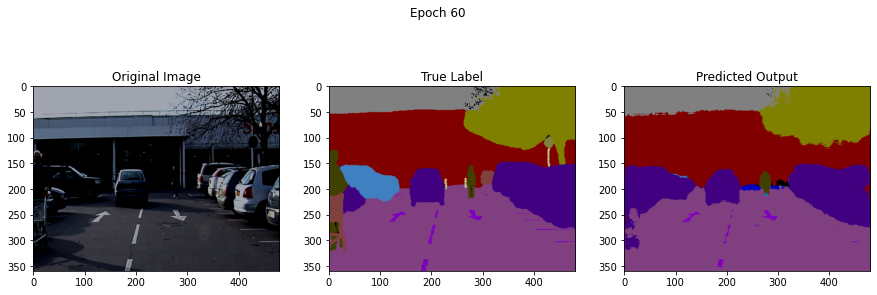

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


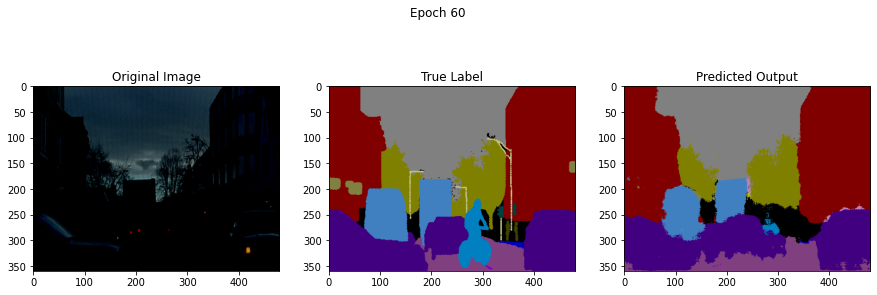

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


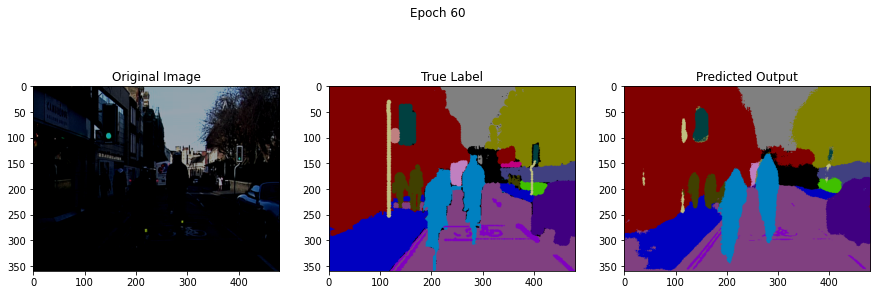

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


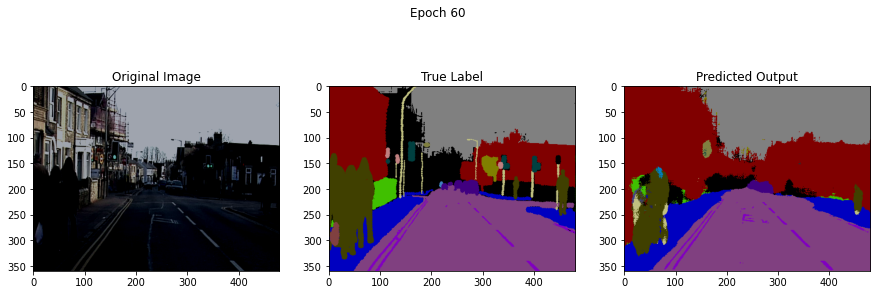

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


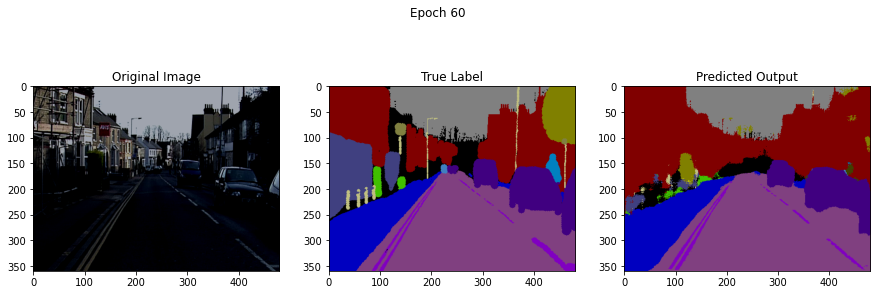

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


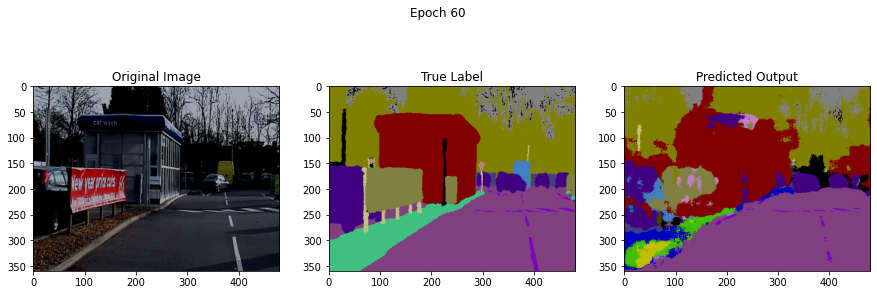

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


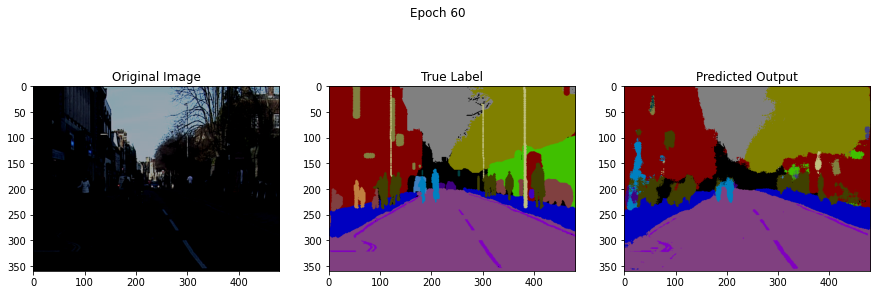

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


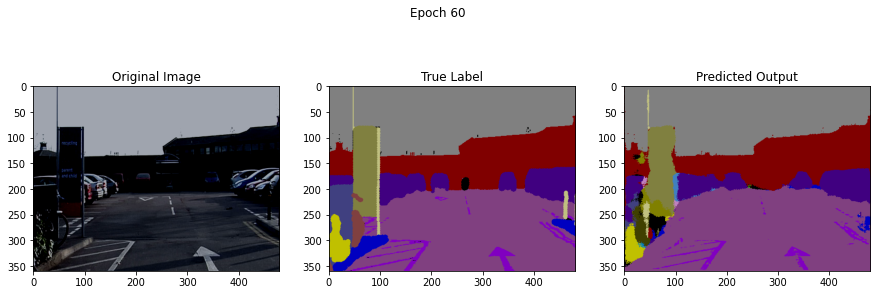

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


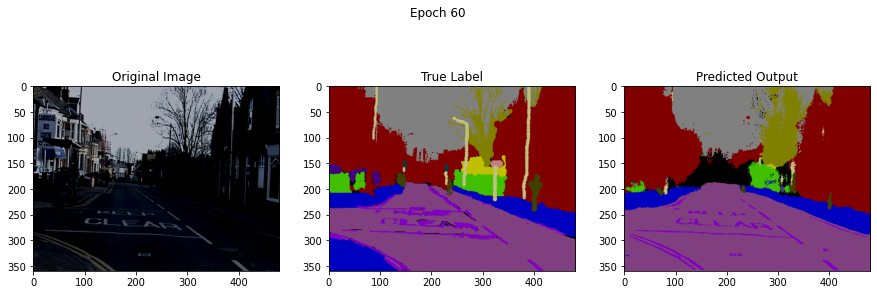

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


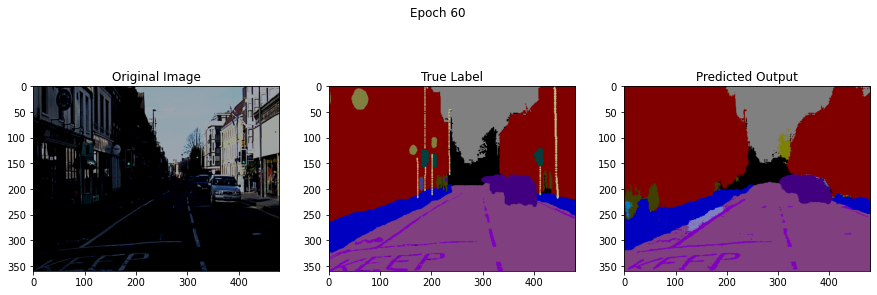

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


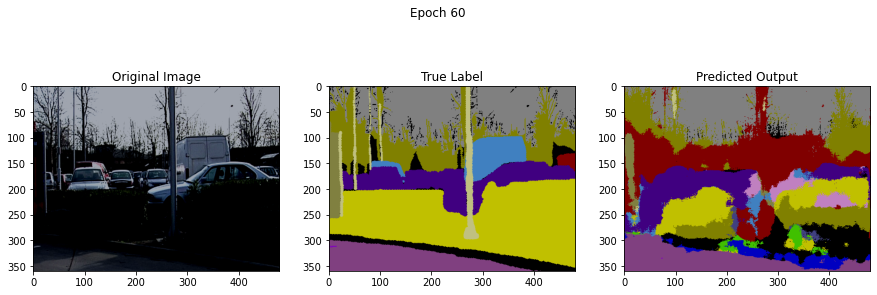

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


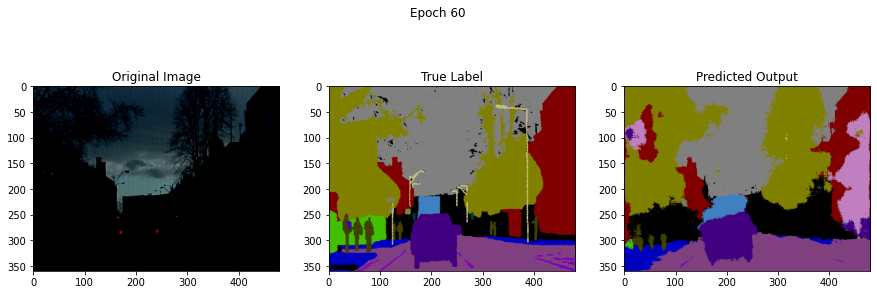

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


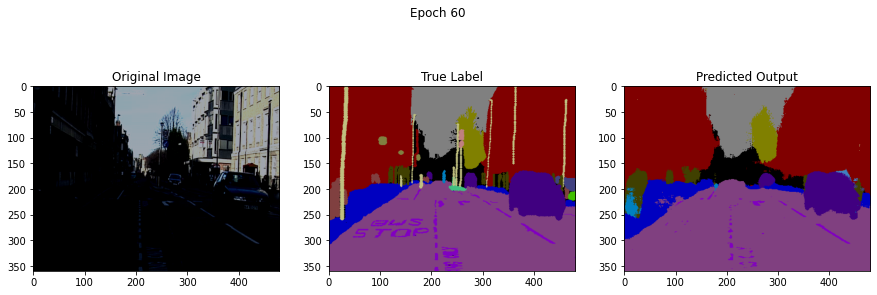

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


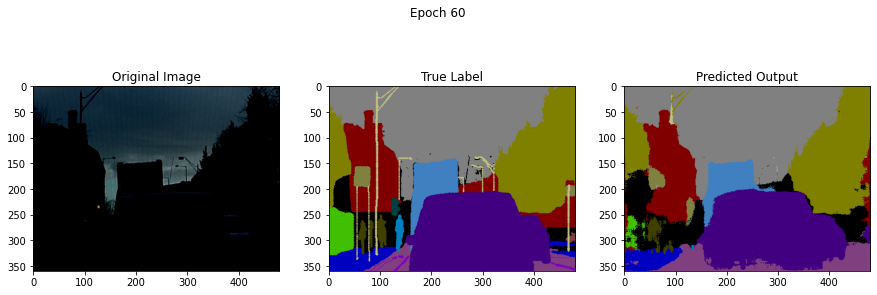

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


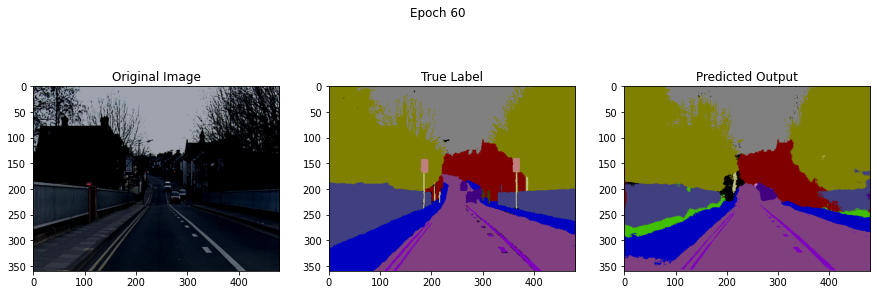

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


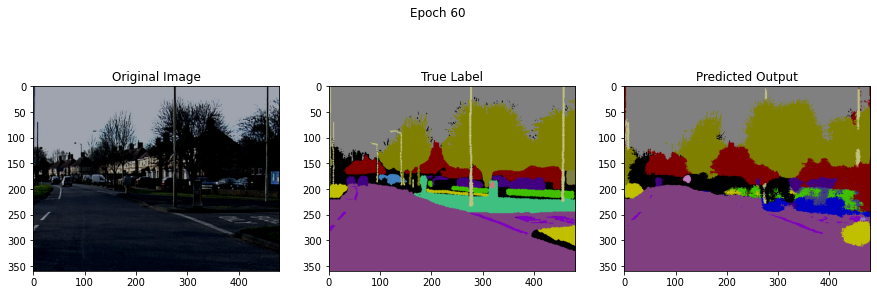

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


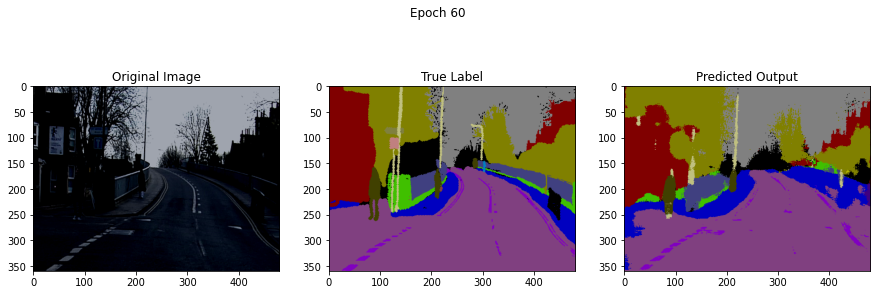

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


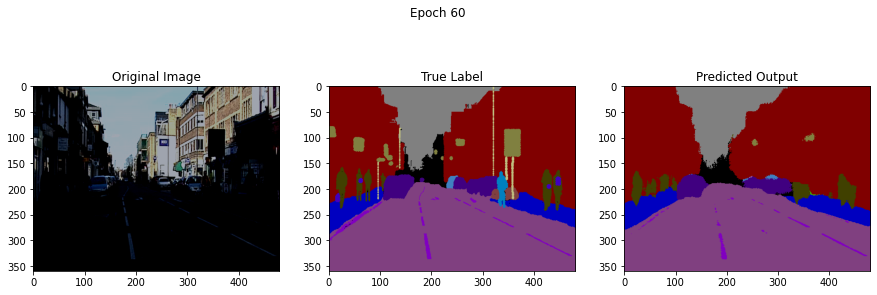

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


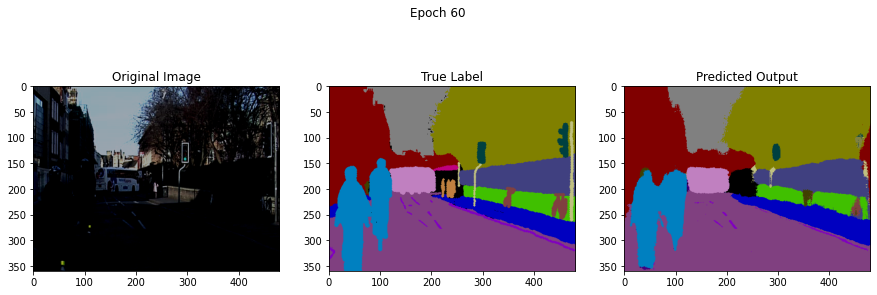

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


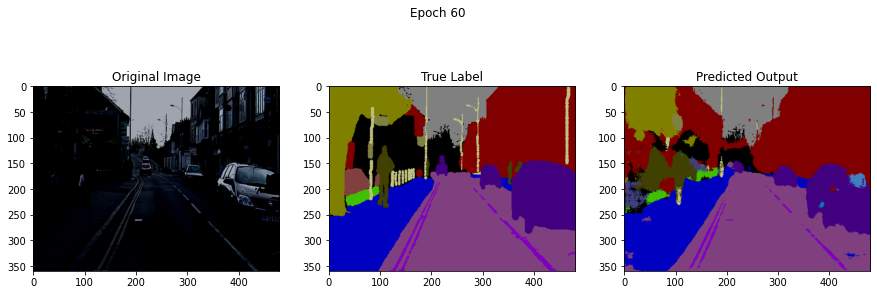

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


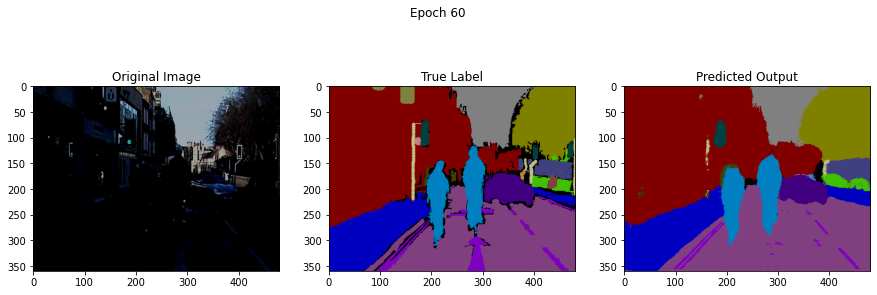

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


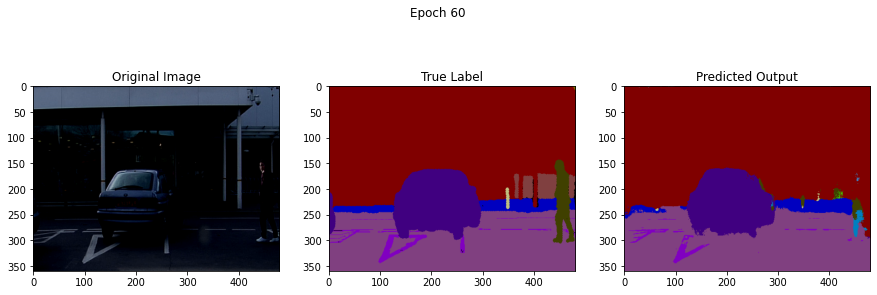

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


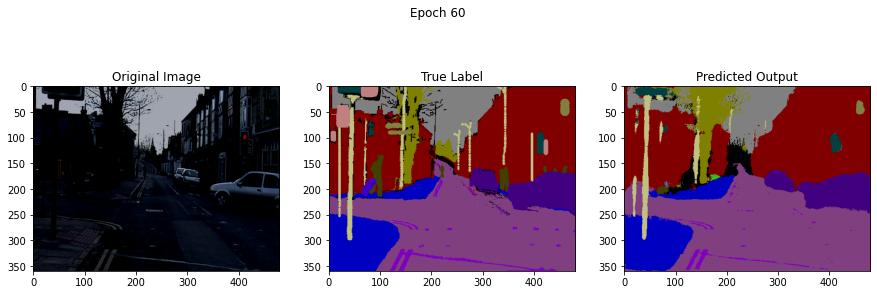

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


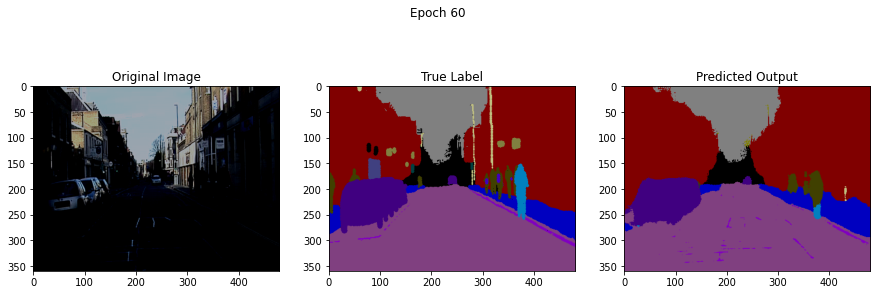

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


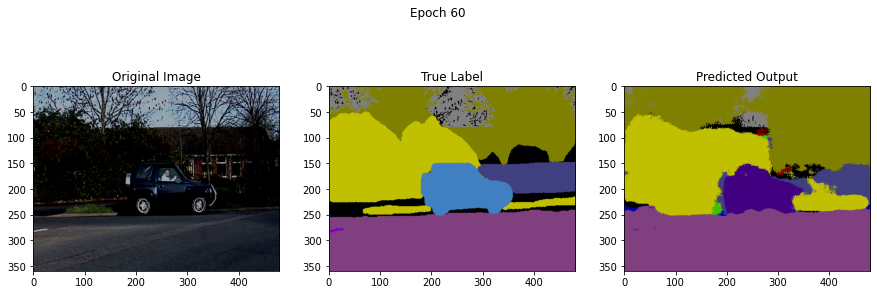

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


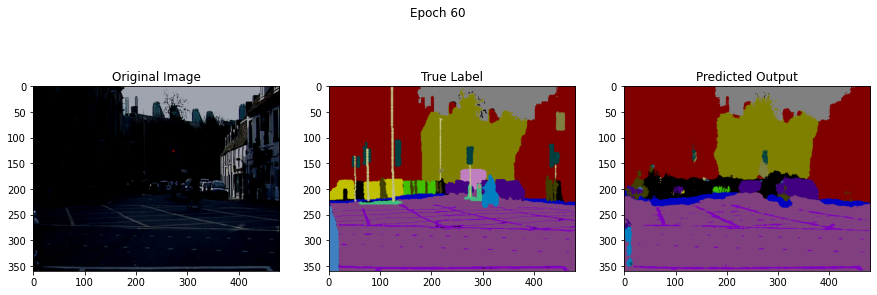

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


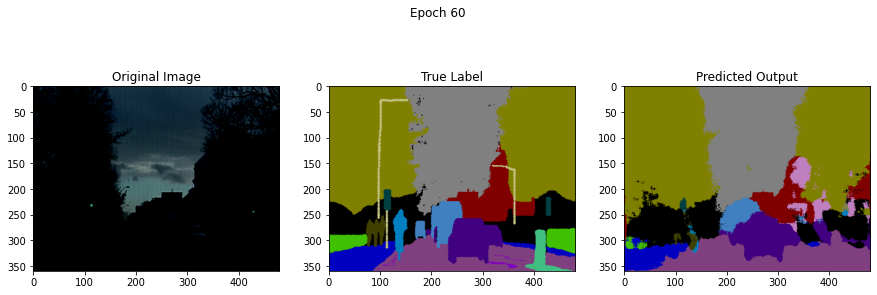

In [20]:
with torch.no_grad():
    i = 0
    for img,  imLabel in testDataCamvid:
      i +=1
      if torch.cuda.is_available:
        img = img.cuda()
        imLabel =  imLabel.cuda()
      outputs = net(img)
      showResults(epoch_ = epoch+1, originalImg = img.cpu().numpy(), label = imLabel.cpu().numpy(), predictedResult = outputs.cpu())
      